In [8]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import scipy

# Graphing helper function
def setup_graph(title='', x_label='', y_label='', fig_size=None):
    fig = plt.figure()
    if fig_size != None:
        fig.set_size_inches(fig_size[0], fig_size[1])
    ax = fig.add_subplot(111)
    ax.set_title(title)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)

# Introduction to Digital Signal Processing

For the purpose of my notebook as an introduction to DSP, I will be examining sound signals.

## Systems and Signals

Excitations are input signals and responses are output signals.
Some examples of signal forms include continuous, discrete, analog, digital, periodic, non-periodic, even symmetry, odd symmetry, and no symmetry forms.
Signals with special waveforms include ramps, exponentials, and impulses.

Signals and systems are either continuous or discrete.

Practical applications of systems include imagers, signal denoising, image deblurring, heart monitoring, music transcribing, and temperature control.


## CONTINUOUS VS. DISCRETE SIGNALS

Mathematically, a signal is any variation of quantity as a function of an independent variable.

Continuous means it is a function which varies with spatial location and time.
Discrete means you are sampling/indexing data from the function at a certain time.

Sampling Theory: There are a minimum number of points to sample a curve, known as 2 * Nyquist frequency.


## CAUSAL VS. NONCAUSAL

Physically realizable systems are real systems (as opposed to purely conceptual or mathematical constructs).

If x(t) == 0 for t < 0, then x(t) is causal.
If x(t) != 0 for t < 0, then x(t) is noncausal.
If x(t) == 0 for t > 0, then x(t) is anticausal.

In practice, we want to evaluate the interaction of causal signals with real systems.


## UNDAMPED VS DAMPED SYSTEMS

Undamped systems have no opposing force to slow down the motion.
Damped systems fade with time (negative e)

The Mass Spring Problem (Simple Harmonic Motion) includes parameters of mass, the spring (which ahs a constant k relating to the material properties of the spring), and force (kx(t) in terms of the spring's properties).


## FAST FOURIER TRANSFORM

Fourier Transform: a mathematical loop to transfer data from the time (spatial, amplitude vs time) to frequency (wave, amplitude vs frequency) domain.

Essentially, we are unmixing the overall signal into its separate signals, and usually we will find a number of higher-amplitude signals that can represent the overall signal and ignore the smaller-amplitude ones as just noise. 
Then, we run the FFT to convert the signals to the frequency domain.

The Phasor diagram is just a nice way to look at our signal mathematically, however we should not rely on it.

# Here, we see visualizations of sound waves for a whistle, pulse, and dial ring.

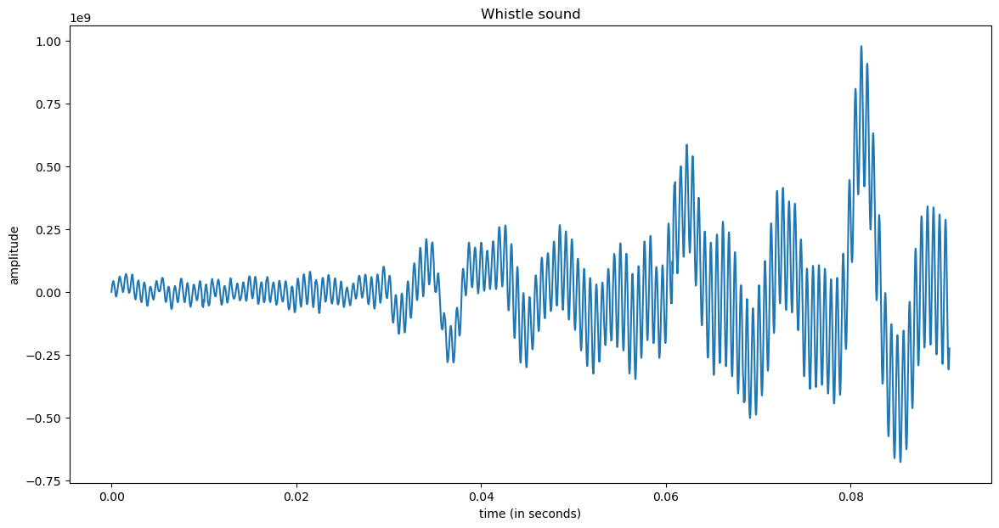

In [9]:
import scipy.io.wavfile

(sample_rate, input_signal) = scipy.io.wavfile.read("audio_files/DSP - Whistle.wav")
time_array = np.arange(0, len(input_signal)/sample_rate, 1/sample_rate)
setup_graph(title='Whistle sound', x_label='time (in seconds)', y_label='amplitude', fig_size=(14,7))
_ = plt.plot(time_array[0:4000], input_signal[0:4000])

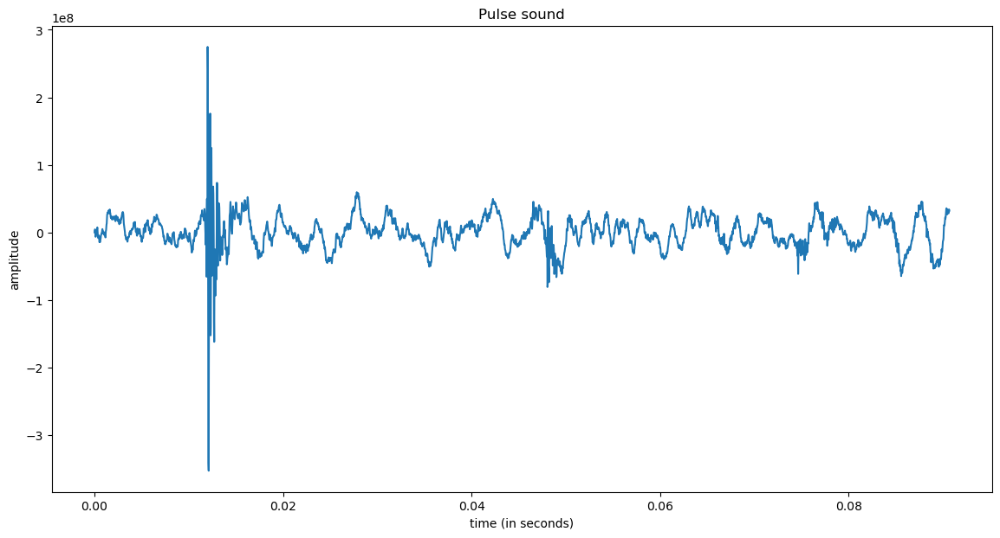

In [65]:
(sample_rate, input_signal) = scipy.io.wavfile.read("audio_files/DSP - Pulse.wav")
time_array = np.arange(0, len(input_signal)/sample_rate, 1/sample_rate)
setup_graph(title='Pulse sound', x_label='time (in seconds)', y_label='amplitude', fig_size=(14,7))
_ = plt.plot(time_array[0:4000], input_signal[0:4000])

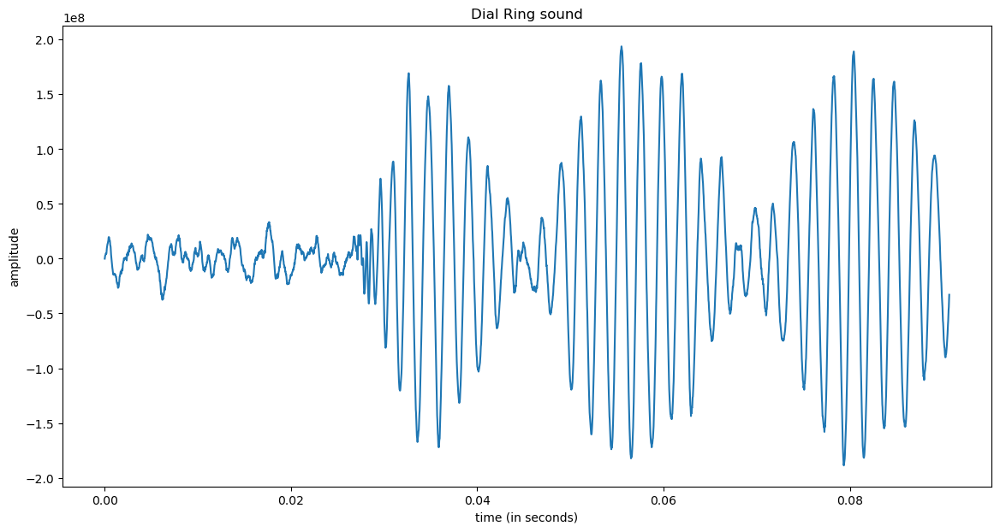

In [67]:
(sample_rate, input_signal) = scipy.io.wavfile.read("audio_files/DSP - Dial Ring.wav")
time_array = np.arange(0, len(input_signal)/sample_rate, 1/sample_rate)
setup_graph(title='Dial Ring sound', x_label='time (in seconds)', y_label='amplitude', fig_size=(14,7))
_ = plt.plot(time_array[0:4000], input_signal[0:4000])

# The Superposition Principle

* We find that any signal is the result from summing other individual signals.

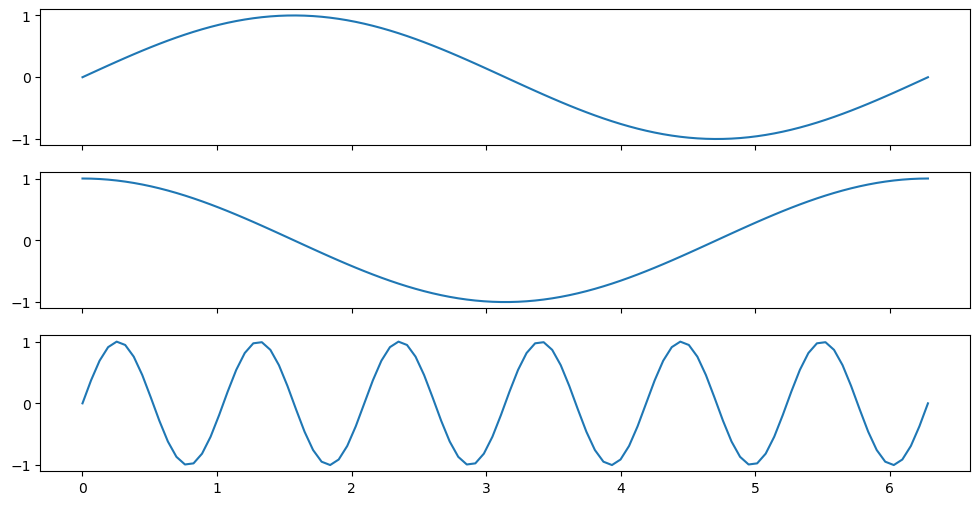

In [18]:
x = np.linspace(0, 2 * np.pi, 100)
y1 = np.sin(x)
y2 = np.cos(x)
y3 = np.sin(6*x)

f, axarr = plt.subplots(3, sharex=True, sharey=True)
f.set_size_inches(12,6)
axarr[0].plot(x, y1)
axarr[1].plot(x, y2)
axarr[2].plot(x, y3)
_ = plt.show()

## We sum these 3 signals into one signal as shown below.

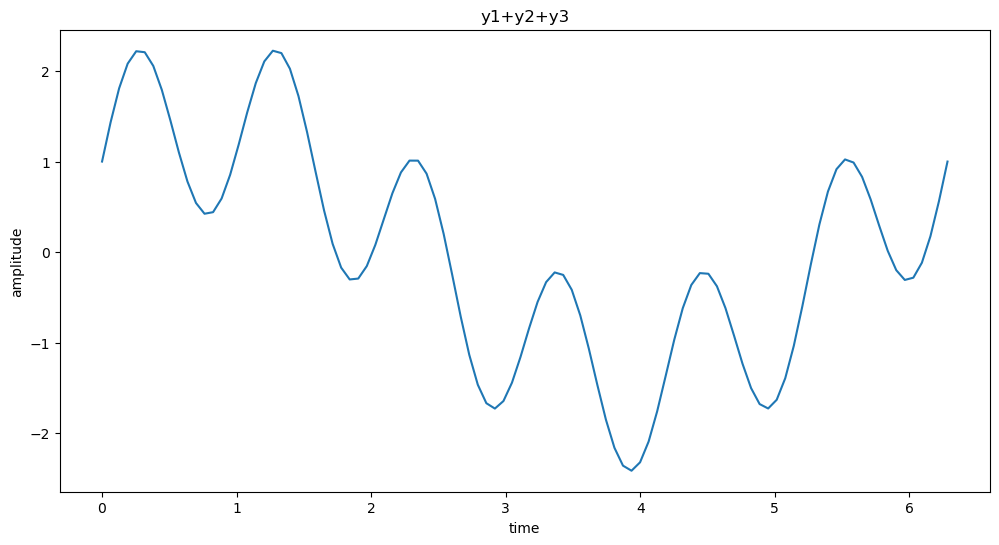

In [21]:
setup_graph(x_label='time', y_label='amplitude', title='y1+y2+y3', fig_size=(12,6))
convoluted_wave = y1 + y2 + y3
_ = plt.plot(x, convoluted_wave)

# Fast Fourier Transform
Let's look at the sum of another 3 signals:

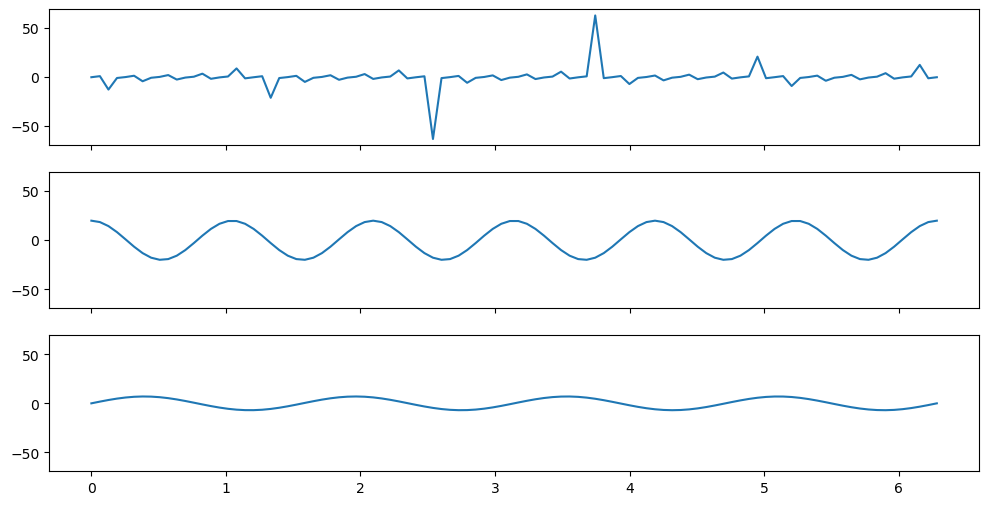

In [64]:
x = np.linspace(0, 2 * np.pi, 100)
y1 = np.tan(13*x)
y2 = 20 * np.cos(6*x)
y3 = 7 * np.sin(4*x)

f, axarr = plt.subplots(3, sharex=True, sharey=True)
f.set_size_inches(12,6)
axarr[0].plot(x, y1)
axarr[1].plot(x, y2)
axarr[2].plot(x, y3)
_ = plt.show()

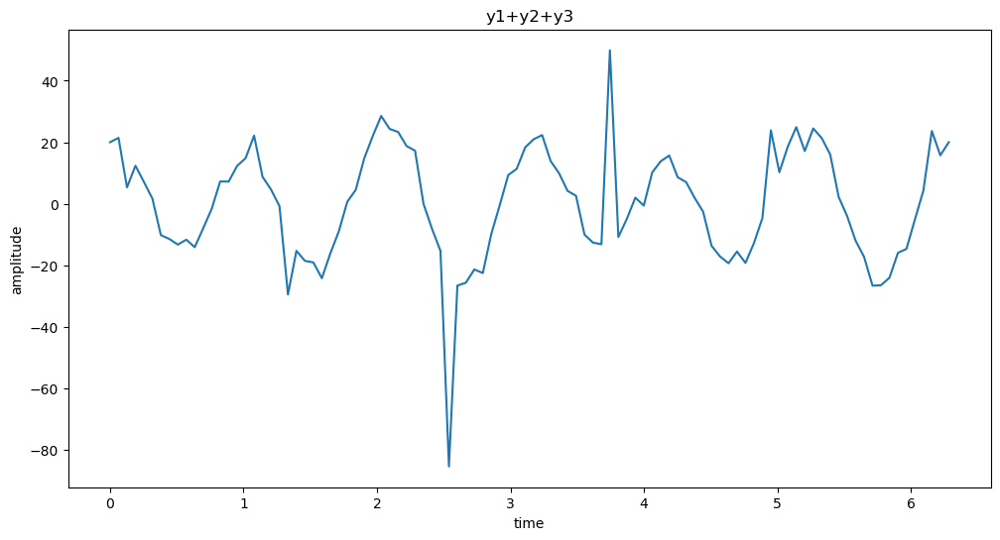

In [65]:
setup_graph(x_label='time', y_label='amplitude', title='y1+y2+y3', fig_size=(12,6))
convoluted_wave = y1 + y2 + y3
_ = plt.plot(x, convoluted_wave)

We use FFT on this signal to convert it from the time domain to frequency domain.

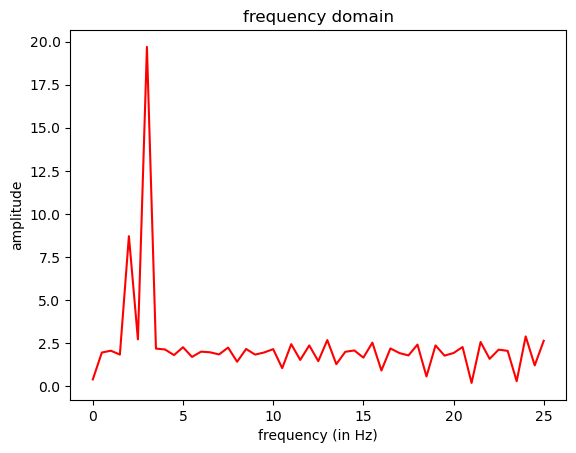

In [71]:
fft_output = np.fft.rfft(convoluted_wave)
num_samples = sample_rate * time_to_plot
magnitude_only = [np.sqrt(i.real**2 + i.imag**2)/len(fft_output) for i in fft_output]
frequencies = [(i*1.0/num_samples)*sample_rate for i in range(num_samples//2+1)]
setup_graph(x_label='frequency (in Hz)', y_label='amplitude', title='frequency domain')
plt.plot(frequencies, magnitude_only, 'r')

Now let's apply FFT to our audio signals from earlier. (44100 kHz)

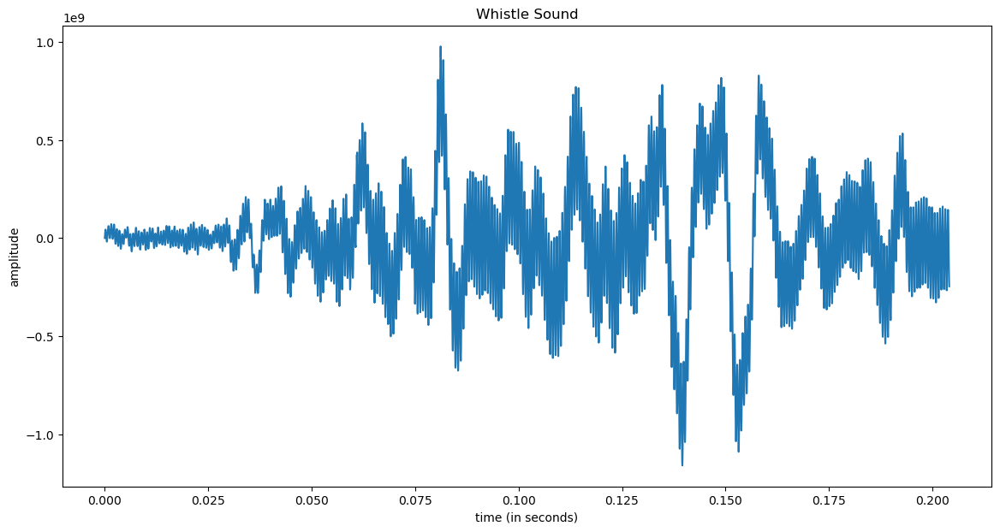

In [141]:
(sample_rate, input_signal) = scipy.io.wavfile.read("audio_files/DSP - Whistle.wav")
time_array = np.arange(0, len(input_signal)/sample_rate, 1/sample_rate)
setup_graph(title='Whistle Sound', x_label='time (in seconds)', y_label='amplitude', fig_size=(14,7))
_ = plt.plot(time_array[0:9000], input_signal[0:9000])

(0.0, 300.0)

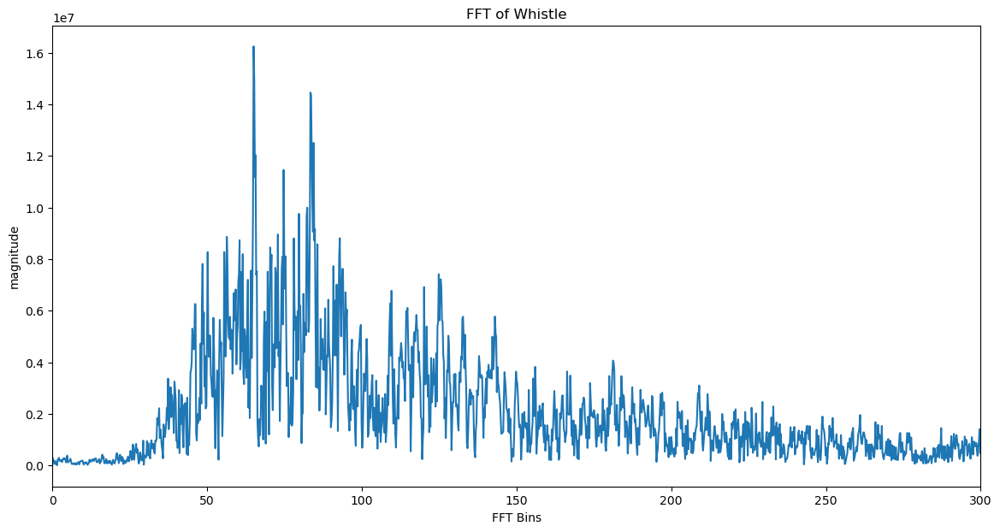

In [143]:
fft_out = np.fft.rfft(input_signal)
fft_mag = [np.sqrt(i.real**2 + i.imag**2)/len(fft_out) for i in fft_out]
num_samples = len(input_signal)
rfreqs = [(i*1.0/num_samples)*sample_rate for i in range(num_samples//2+1)]

setup_graph(title='FFT of Whistle', x_label='FFT Bins', y_label='magnitude', fig_size=(14,7))
_ = plt.plot(rfreqs[0:3000], fft_mag[0:3000])
plt.xlim(0, 300)

44100


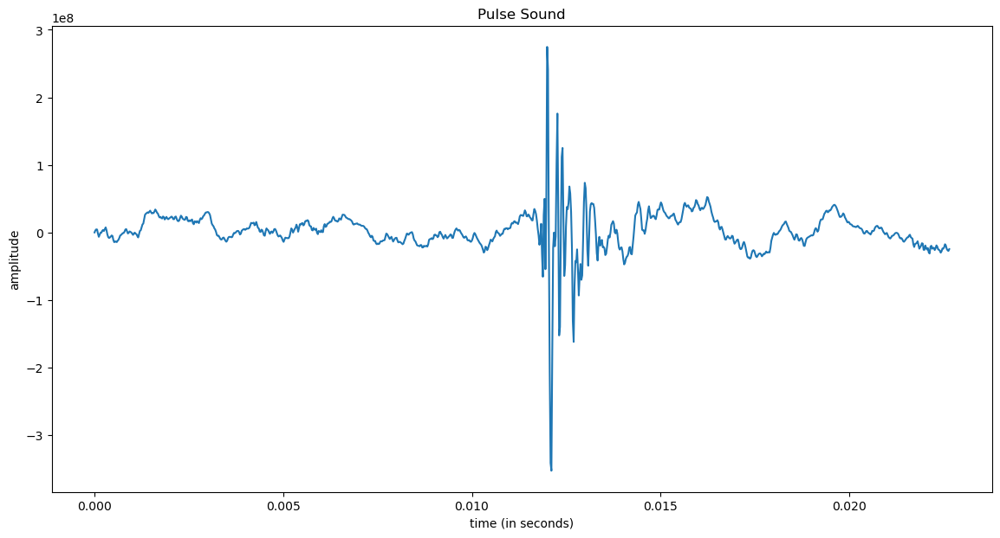

In [116]:
(sample_rate, input_signal) = scipy.io.wavfile.read("audio_files/DSP - Pulse.wav")
time_array = np.arange(0, len(input_signal)/sample_rate, 1/sample_rate)
setup_graph(title='Pulse Sound', x_label='time (in seconds)', y_label='amplitude', fig_size=(14,7))
_ = plt.plot(time_array[0:1000], input_signal[0:1000])
print(sample_rate)

(0.0, 500.0)

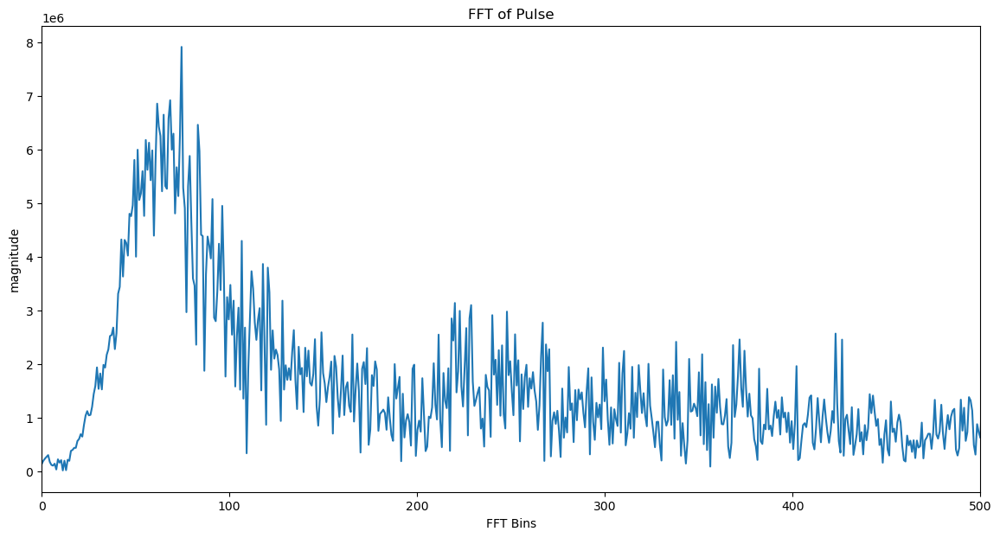

In [114]:
fft_out = np.fft.rfft(input_signal)
fft_mag = [np.sqrt(i.real**2 + i.imag**2)/len(fft_out) for i in fft_out]
num_samples = len(input_signal)
rfreqs = [(i*1.0/num_samples)*sample_rate for i in range(num_samples//2+1)]

setup_graph(title='FFT of Pulse', x_label='FFT Bins', y_label='magnitude', fig_size=(14,7))
_ = plt.plot(rfreqs[0:1000], fft_mag[0:1000])
np.max(rfreqs)
len(rfreqs)
plt.xlim(0,500)

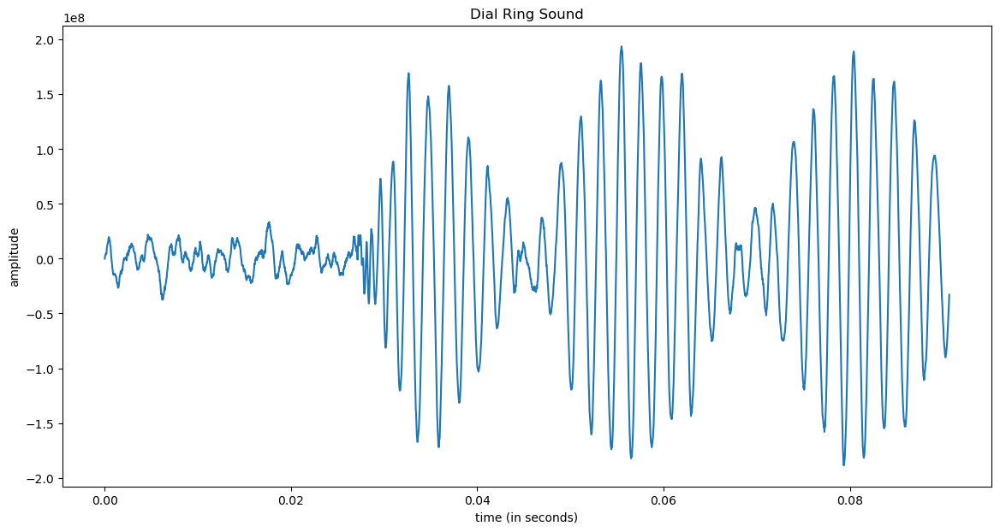

In [163]:
(sample_rate, input_signal) = scipy.io.wavfile.read("audio_files/DSP - Dial Ring.wav")
time_array = np.arange(0, len(input_signal)/sample_rate, 1/sample_rate)
setup_graph(title='Dial Ring Sound', x_label='time (in seconds)', y_label='amplitude', fig_size=(14,7))
_ = plt.plot(time_array[0:4000], input_signal[0:4000])

(400.0, 500.0)

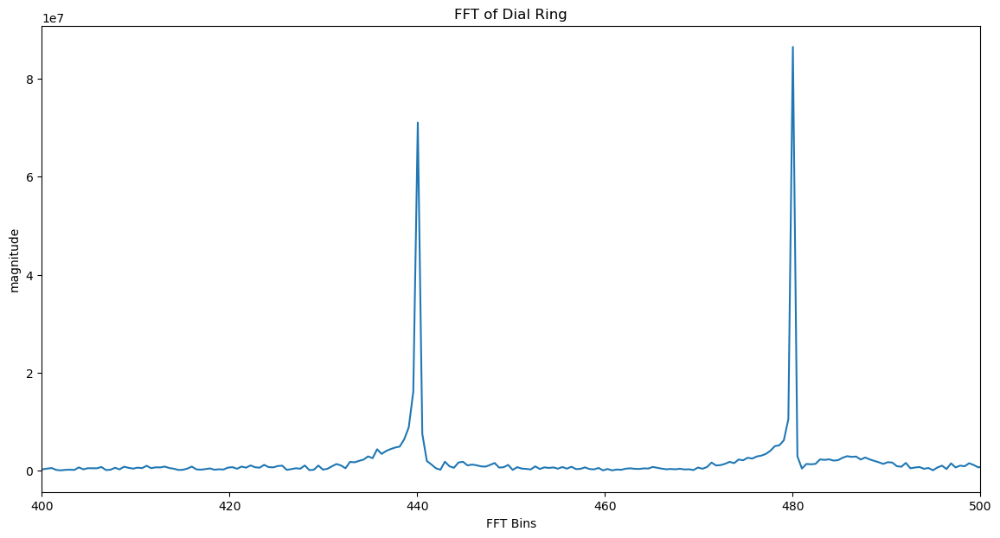

In [169]:
fft_out = np.fft.rfft(input_signal)
fft_mag = [np.sqrt(i.real**2 + i.imag**2)/len(fft_out) for i in fft_out]
num_samples = len(input_signal)
rfreqs = [(i*1.0/num_samples)*sample_rate for i in range(num_samples//2+1)]

setup_graph(title='FFT of Dial Ring', x_label='FFT Bins', y_label='magnitude', fig_size=(14,7))
_ = plt.plot(rfreqs[0:3000], fft_mag[0:3000])
plt.xlim(400, 500)

# Spectrograms (FFT Over Time - 3D)
We determine a suitable window size and slide it across the signal while applying FFT simultaenously (the windows can overlap).<br>
X-axis represents time<br>
Y-axis represents frequency<br>
Colors represent amplitude

In [57]:
(whistle_sample_rate, whistle) = scipy.io.wavfile.read("audio_files/DSP - Whistle.wav")

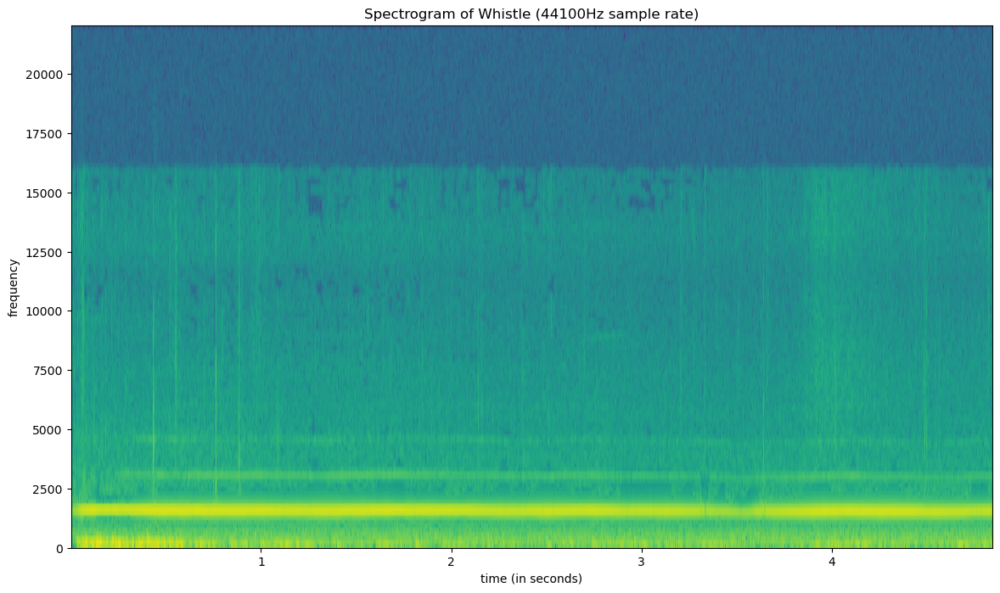

In [46]:
setup_graph(title='Spectrogram of Whistle (44100Hz sample rate)', x_label='time (in seconds)', y_label='frequency', fig_size=(14,8))
_ = plt.specgram(whistle, Fs=whistle_sample_rate)

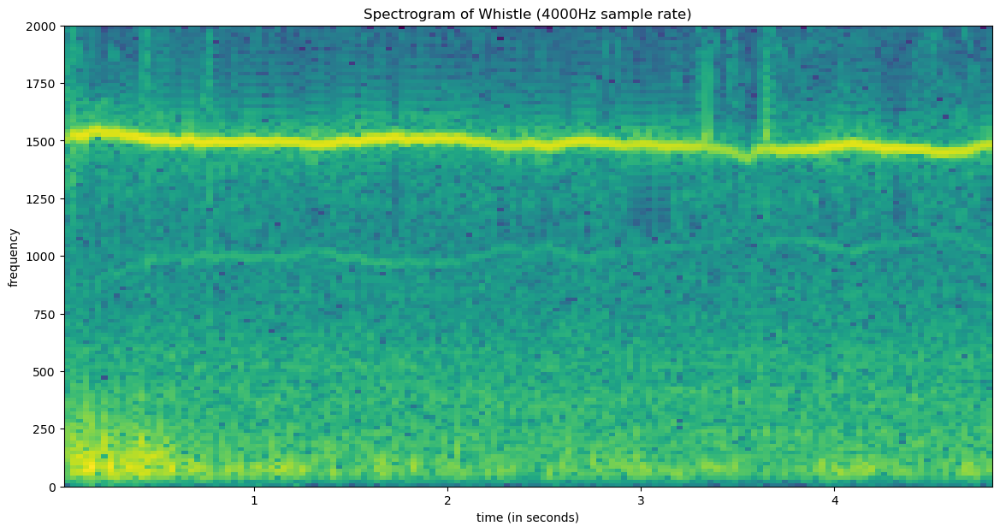

In [58]:
whistle_4000hz = [whistle[i] for i in range(0, len(whistle), 44100//4000)]
setup_graph(title='Spectrogram of Whistle (4000Hz sample rate)', x_label='time (in seconds)', y_label='frequency', fig_size=(14,7))
_ = plt.specgram(whistle_4000hz, Fs=4000)

In [60]:
(pulse_sample_rate, pulse) = scipy.io.wavfile.read("audio_files/DSP - Pulse.wav")

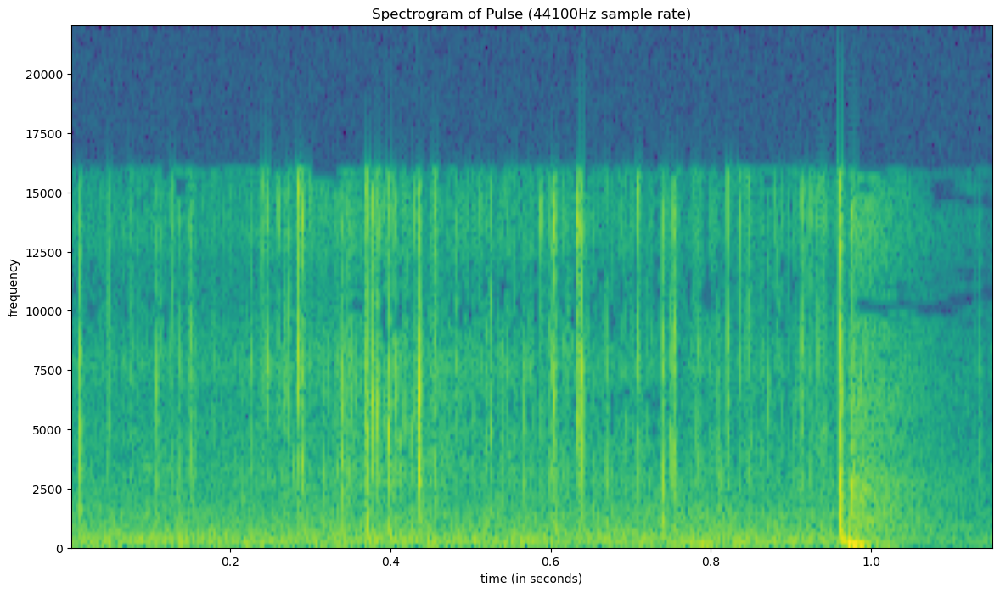

In [47]:
setup_graph(title='Spectrogram of Pulse (44100Hz sample rate)', x_label='time (in seconds)', y_label='frequency', fig_size=(14,8))
_ = plt.specgram(pulse, Fs=pulse_sample_rate)

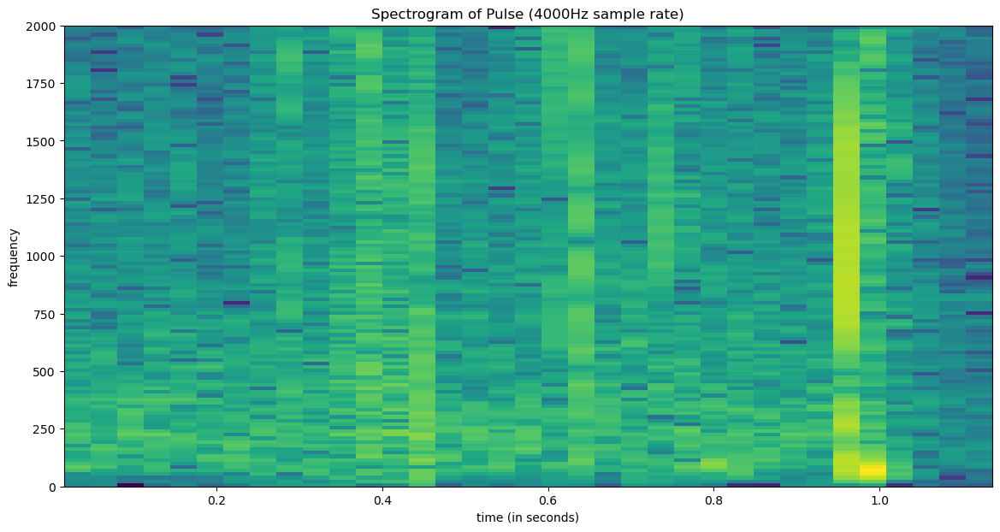

In [61]:
pulse_4000hz = [pulse[i] for i in range(0, len(pulse), 44100//4000)]
setup_graph(title='Spectrogram of Pulse (4000Hz sample rate)', x_label='time (in seconds)', y_label='frequency', fig_size=(14,7))
_ = plt.specgram(pulse_4000hz, Fs=4000)

In [62]:
(dialring_sample_rate, dialring) = scipy.io.wavfile.read("audio_files/DSP - Dial Ring.wav")

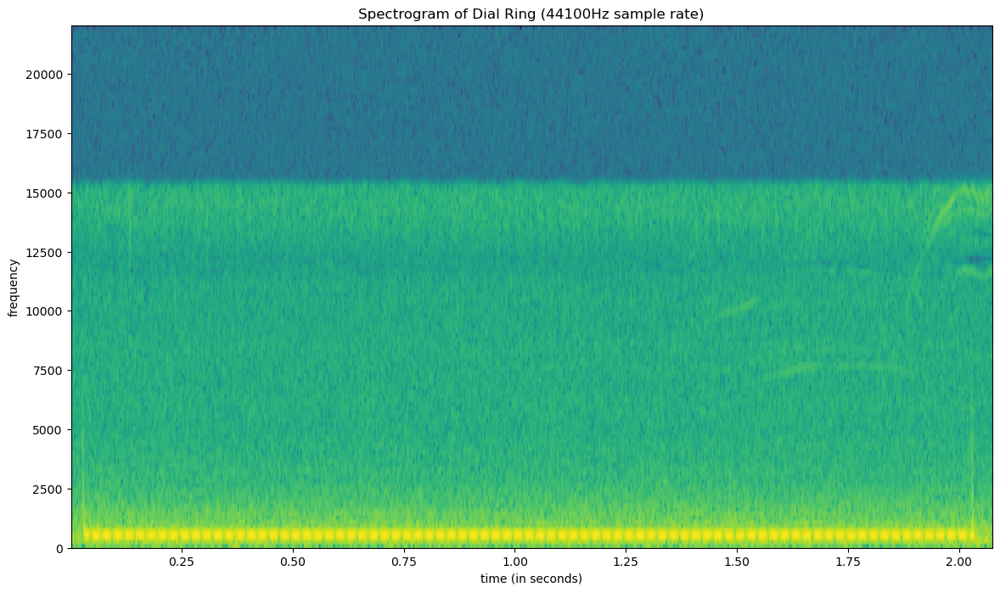

In [48]:
setup_graph(title='Spectrogram of Dial Ring (44100Hz sakmple rate)', x_label='time (in seconds)', y_label='frequency', fig_size=(14,8))
_ = plt.specgram(dialring, Fs=dialring_sample_rate)

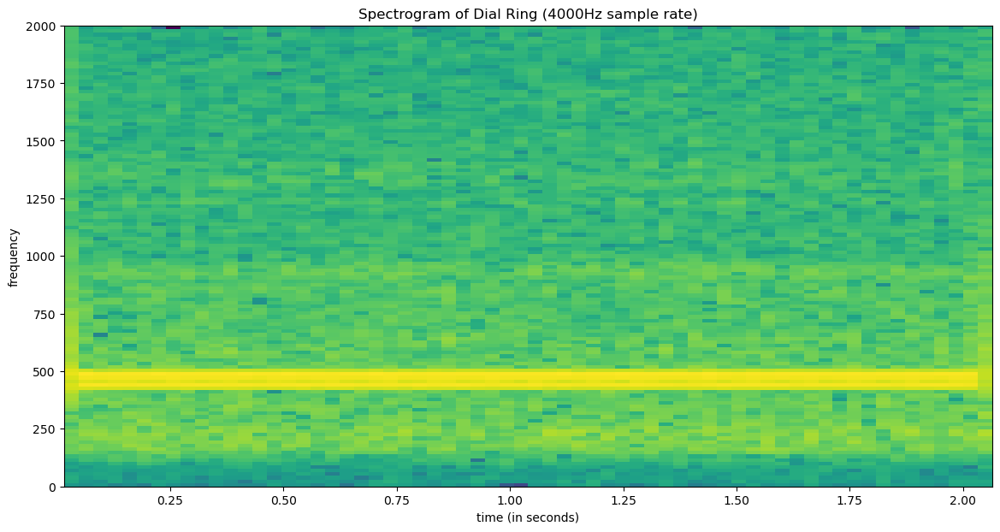

In [63]:
dialring_4000hz = [dialring[i] for i in range(0, len(dialring), 44100//4000)]
setup_graph(title='Spectrogram of Dial Ring (4000Hz sample rate)', x_label='time (in seconds)', y_label='frequency', fig_size=(14,7))
_ = plt.specgram(dialring_4000hz, Fs=4000)

# Application of FFT: iPhone Dialpad Signals

## Dial 1 = F5 and D#6 (but a bit sharper)

(600.0, 1300.0)

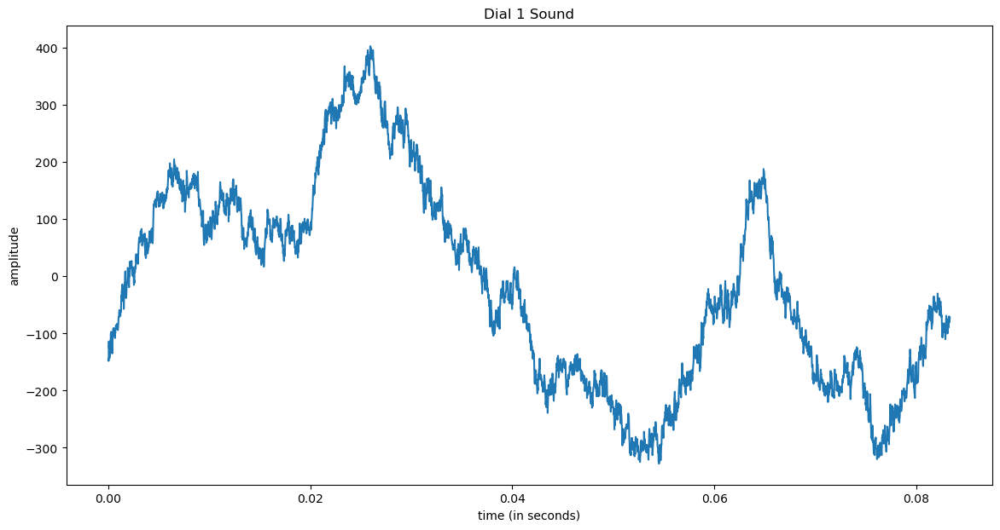

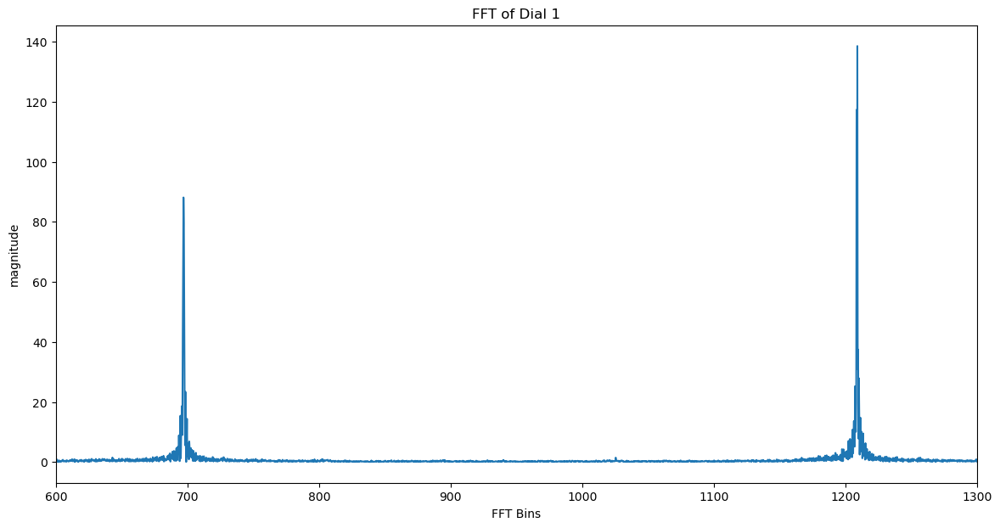

In [203]:
(sample_rate, input_signal) = scipy.io.wavfile.read("audio_files/Dial1.wav")
time_array = np.arange(0, len(input_signal)/sample_rate, 1/sample_rate)
setup_graph(title='Dial 1 Sound', x_label='time (in seconds)', y_label='amplitude', fig_size=(14,7))
_ = plt.plot(time_array[0:4000], input_signal[0:4000])

fft_out = np.fft.rfft(input_signal)
fft_mag = [np.sqrt(i.real**2 + i.imag**2)/len(fft_out) for i in fft_out]
num_samples = len(input_signal)
rfreqs = [(i*1.0/num_samples)*sample_rate for i in range(num_samples//2+1)]

setup_graph(title='FFT of Dial 1', x_label='FFT Bins', y_label='magnitude', fig_size=(14,7))
_ = plt.plot(rfreqs[0:5000], fft_mag[0:5000])
plt.xlim(600, 1300)

## Dial 2 = F5 and F6 (but a bit flatter)

(600.0, 1500.0)

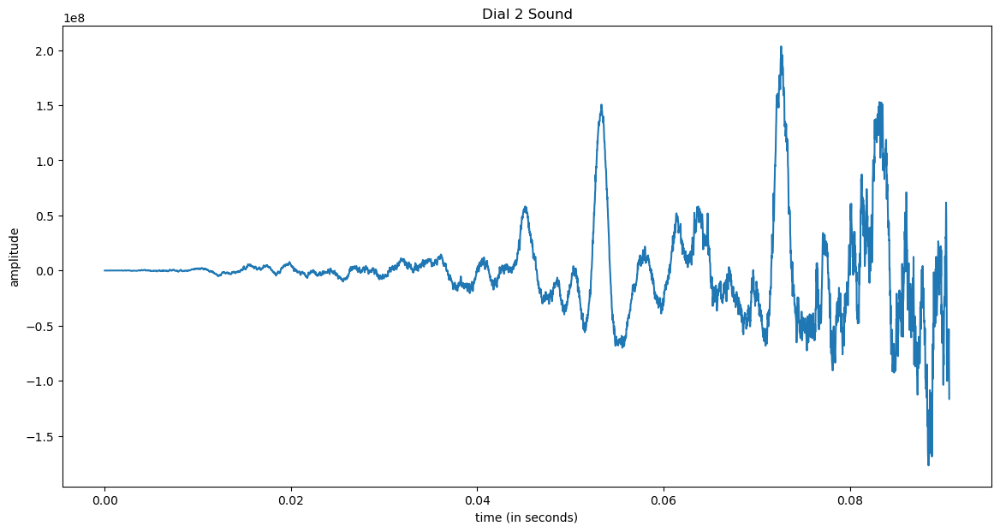

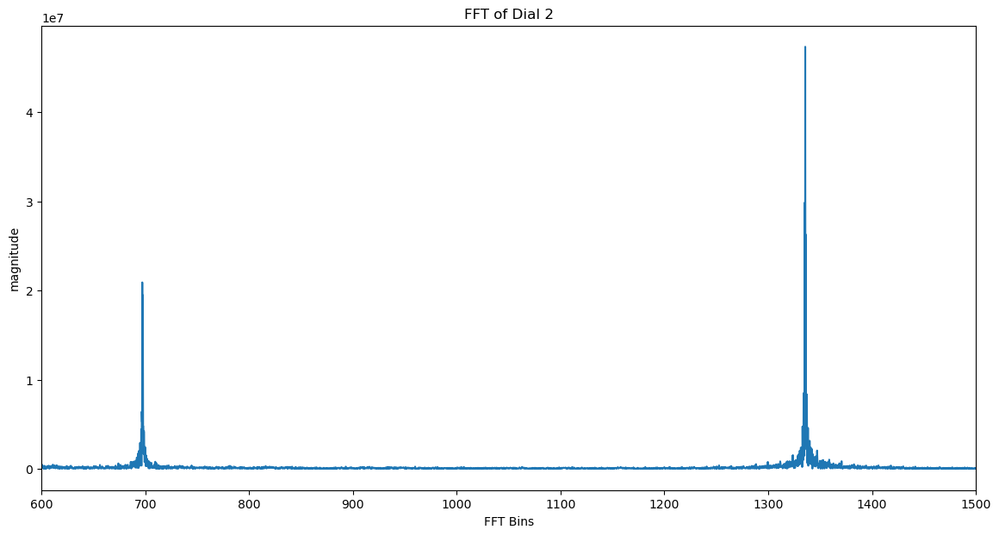

In [202]:
(sample_rate, input_signal) = scipy.io.wavfile.read("audio_files/Dial2.wav")
time_array = np.arange(0, len(input_signal)/sample_rate, 1/sample_rate)
setup_graph(title='Dial 2 Sound', x_label='time (in seconds)', y_label='amplitude', fig_size=(14,7))
_ = plt.plot(time_array[0:4000], input_signal[0:4000])

fft_out = np.fft.rfft(input_signal)
fft_mag = [np.sqrt(i.real**2 + i.imag**2)/len(fft_out) for i in fft_out]
num_samples = len(input_signal)
rfreqs = [(i*1.0/num_samples)*sample_rate for i in range(num_samples//2+1)]

setup_graph(title='FFT of Dial 2', x_label='FFT Bins', y_label='magnitude', fig_size=(14,7))
_ = plt.plot(rfreqs[0:7000], fft_mag[0:7000])
plt.xlim(600, 1500)

## Dial 3 = F5 and F#6 (but a bit sharper)

(650.0, 1550.0)

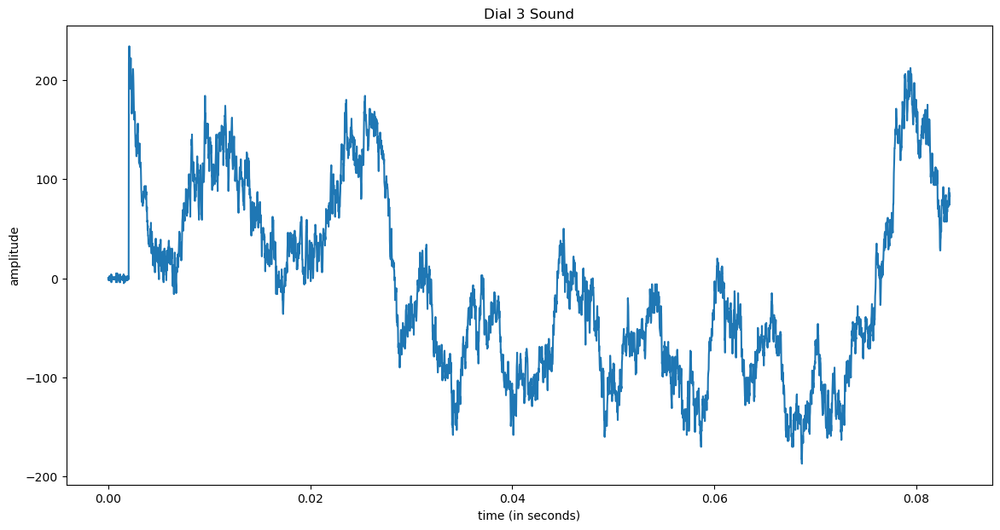

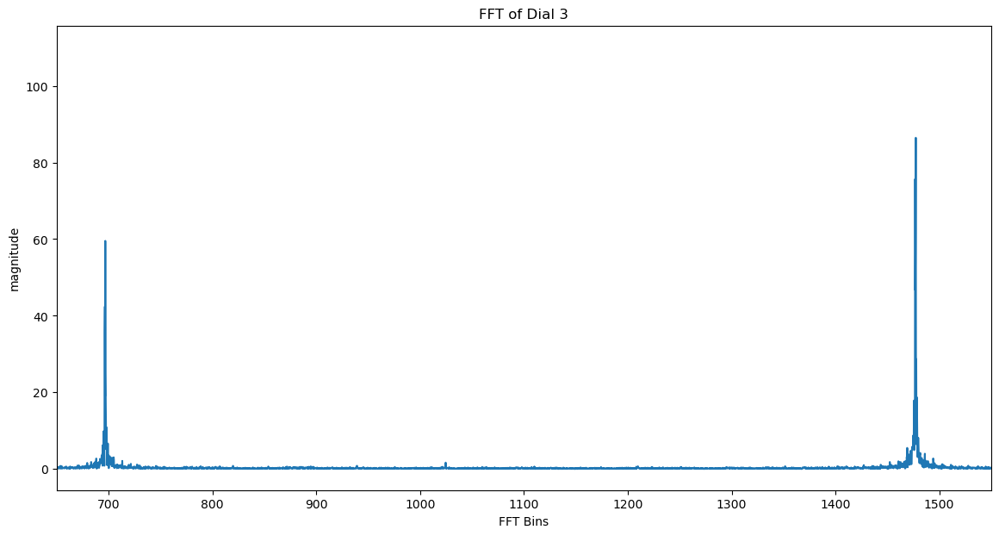

In [200]:
(sample_rate, input_signal) = scipy.io.wavfile.read("audio_files/Dial3.wav")
time_array = np.arange(0, len(input_signal)/sample_rate, 1/sample_rate)
setup_graph(title='Dial 3 Sound', x_label='time (in seconds)', y_label='amplitude', fig_size=(14,7))
_ = plt.plot(time_array[0:4000], input_signal[0:4000])

fft_out = np.fft.rfft(input_signal)
fft_mag = [np.sqrt(i.real**2 + i.imag**2)/len(fft_out) for i in fft_out]
num_samples = len(input_signal)
rfreqs = [(i*1.0/num_samples)*sample_rate for i in range(num_samples//2+1)]

setup_graph(title='FFT of Dial 3', x_label='FFT Bins', y_label='magnitude', fig_size=(14,7))
_ = plt.plot(rfreqs[0:10000], fft_mag[0:10000])
plt.xlim(650, 1550)

## Dial 4 = G5 and D#6 (but a bit sharper)

(700.0, 1300.0)

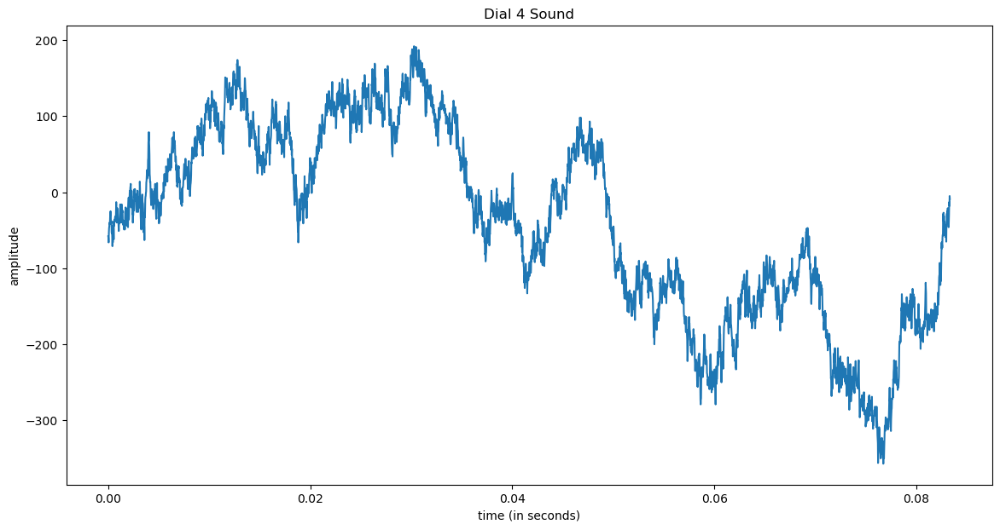

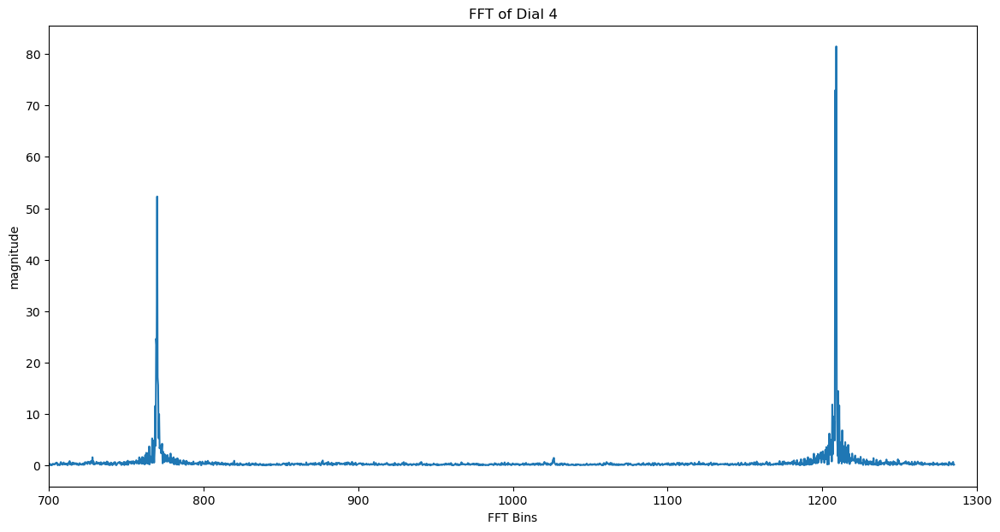

In [212]:
(sample_rate, input_signal) = scipy.io.wavfile.read("audio_files/Dial4.wav")
time_array = np.arange(0, len(input_signal)/sample_rate, 1/sample_rate)
setup_graph(title='Dial 4 Sound', x_label='time (in seconds)', y_label='amplitude', fig_size=(14,7))
_ = plt.plot(time_array[0:4000], input_signal[0:4000])

fft_out = np.fft.rfft(input_signal)
fft_mag = [np.sqrt(i.real**2 + i.imag**2)/len(fft_out) for i in fft_out]
num_samples = len(input_signal)
rfreqs = [(i*1.0/num_samples)*sample_rate for i in range(num_samples//2+1)]

setup_graph(title='FFT of Dial 4', x_label='FFT Bins', y_label='magnitude', fig_size=(14,7))
_ = plt.plot(rfreqs[0:4000], fft_mag[0:4000])
plt.xlim(700, 1300)

## Dial 5 = G5 and F6 (but a bit flatter)

(700.0, 1400.0)

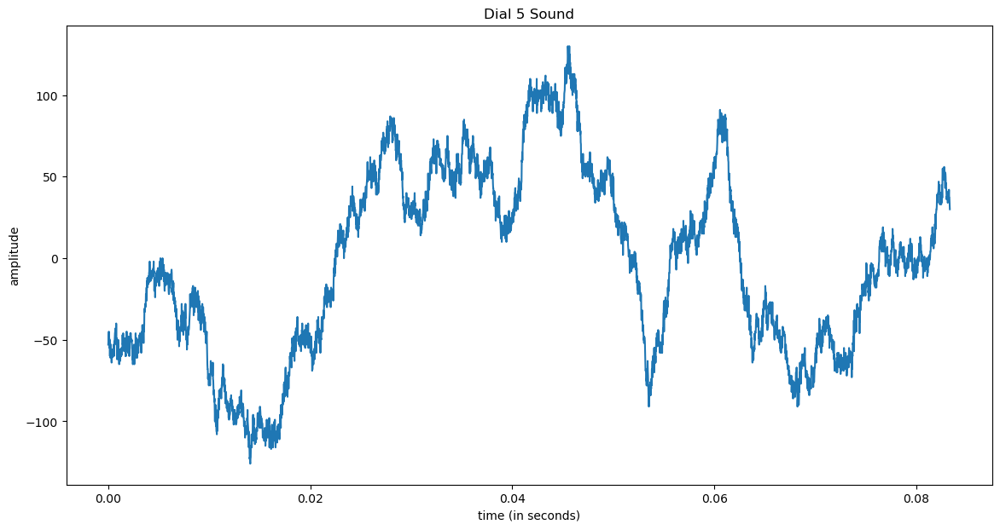

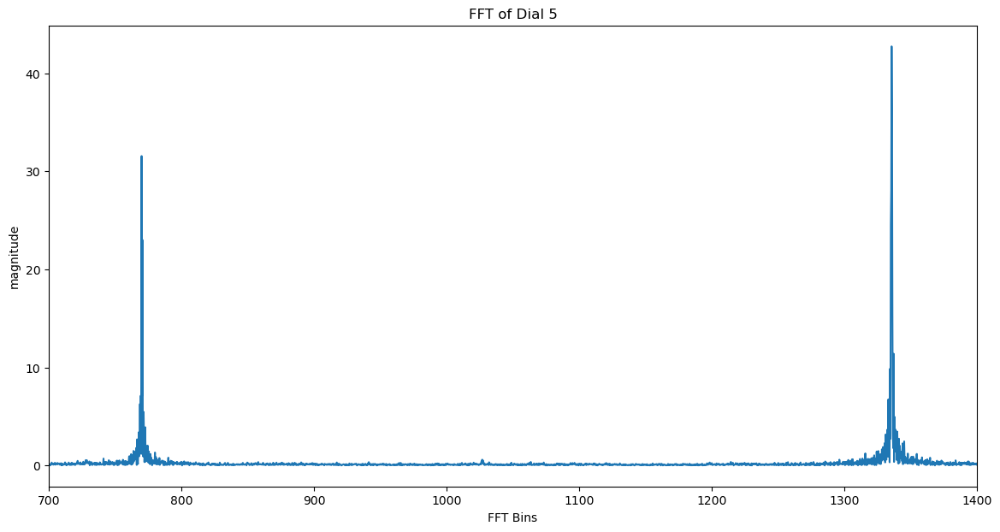

In [218]:
(sample_rate, input_signal) = scipy.io.wavfile.read("audio_files/Dial5.wav")
time_array = np.arange(0, len(input_signal)/sample_rate, 1/sample_rate)
setup_graph(title='Dial 5 Sound', x_label='time (in seconds)', y_label='amplitude', fig_size=(14,7))
_ = plt.plot(time_array[0:4000], input_signal[0:4000])

fft_out = np.fft.rfft(input_signal)
fft_mag = [np.sqrt(i.real**2 + i.imag**2)/len(fft_out) for i in fft_out]
num_samples = len(input_signal)
rfreqs = [(i*1.0/num_samples)*sample_rate for i in range(num_samples//2+1)]

setup_graph(title='FFT of Dial 5', x_label='FFT Bins', y_label='magnitude', fig_size=(14,7))
_ = plt.plot(rfreqs[0:5000], fft_mag[0:5000])
plt.xlim(700, 1400)

## Dial 6 = G5 and F#6 (but a bit sharper)

(700.0, 1600.0)

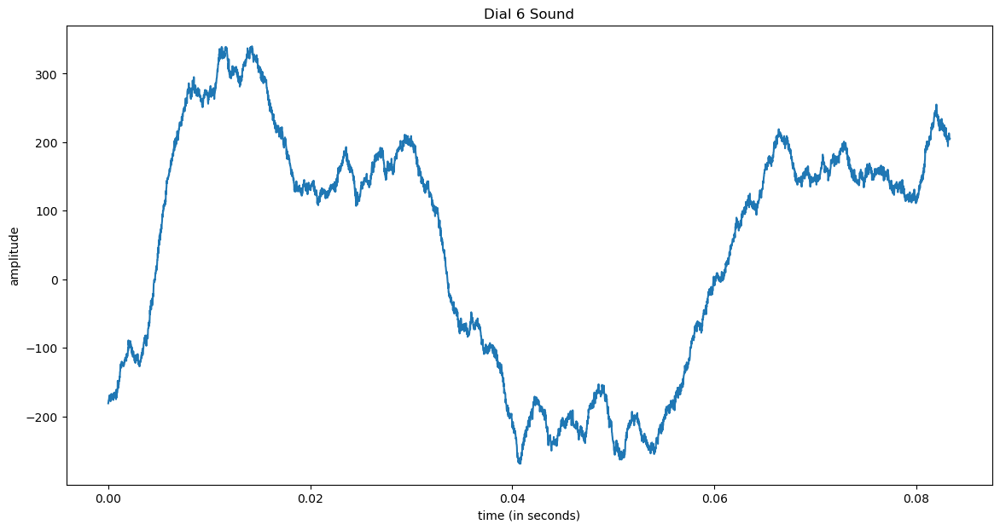

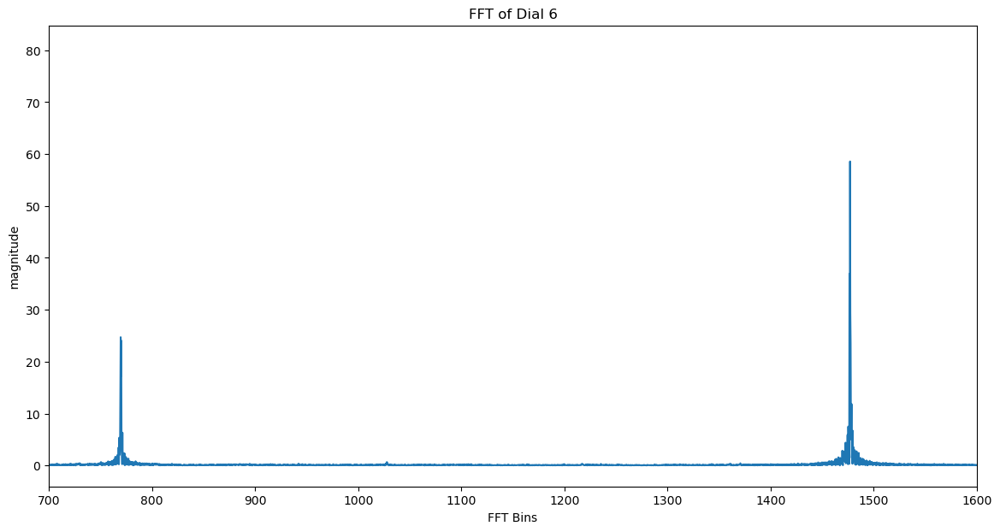

In [222]:
(sample_rate, input_signal) = scipy.io.wavfile.read("audio_files/Dial6.wav")
time_array = np.arange(0, len(input_signal)/sample_rate, 1/sample_rate)
setup_graph(title='Dial 6 Sound', x_label='time (in seconds)', y_label='amplitude', fig_size=(14,7))
_ = plt.plot(time_array[0:4000], input_signal[0:4000])

fft_out = np.fft.rfft(input_signal)
fft_mag = [np.sqrt(i.real**2 + i.imag**2)/len(fft_out) for i in fft_out]
num_samples = len(input_signal)
rfreqs = [(i*1.0/num_samples)*sample_rate for i in range(num_samples//2+1)]

setup_graph(title='FFT of Dial 6', x_label='FFT Bins', y_label='magnitude', fig_size=(14,7))
_ = plt.plot(rfreqs[0:6000], fft_mag[0:6000])
plt.xlim(700, 1600)

## Dial 7 = G#5 and D#6 (but a bit sharper)

(800.0, 1300.0)

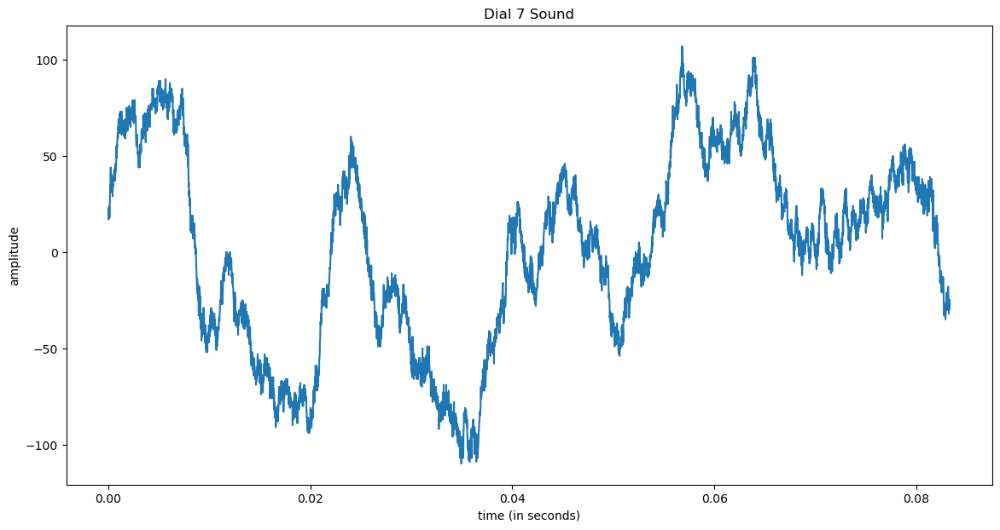

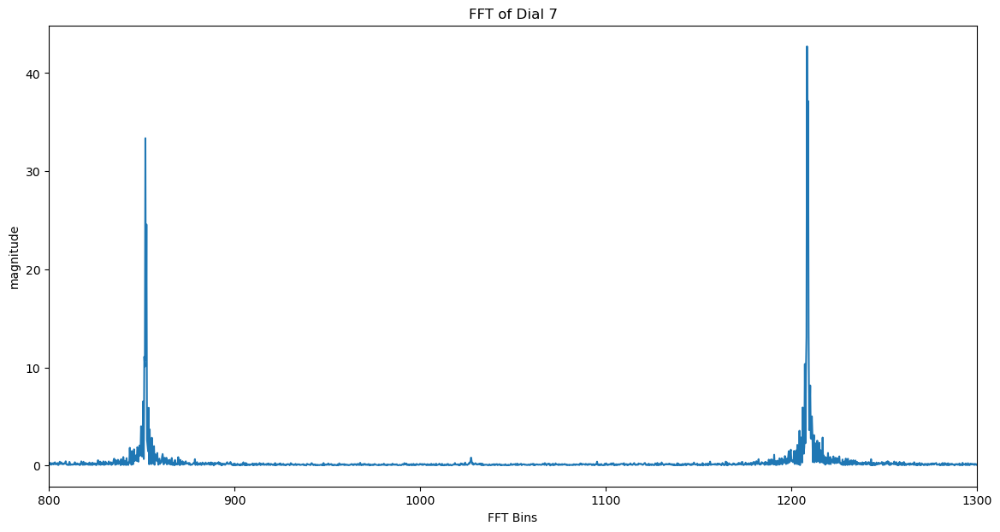

In [225]:
(sample_rate, input_signal) = scipy.io.wavfile.read("audio_files/Dial7.wav")
time_array = np.arange(0, len(input_signal)/sample_rate, 1/sample_rate)
setup_graph(title='Dial 7 Sound', x_label='time (in seconds)', y_label='amplitude', fig_size=(14,7))
_ = plt.plot(time_array[0:4000], input_signal[0:4000])

fft_out = np.fft.rfft(input_signal)
fft_mag = [np.sqrt(i.real**2 + i.imag**2)/len(fft_out) for i in fft_out]
num_samples = len(input_signal)
rfreqs = [(i*1.0/num_samples)*sample_rate for i in range(num_samples//2+1)]

setup_graph(title='FFT of Dial 7', x_label='FFT Bins', y_label='magnitude', fig_size=(14,7))
_ = plt.plot(rfreqs[0:6000], fft_mag[0:6000])
plt.xlim(800, 1300)

## Dial 8 - G#5 and F6 (but a bit flatter)

(800.0, 1400.0)

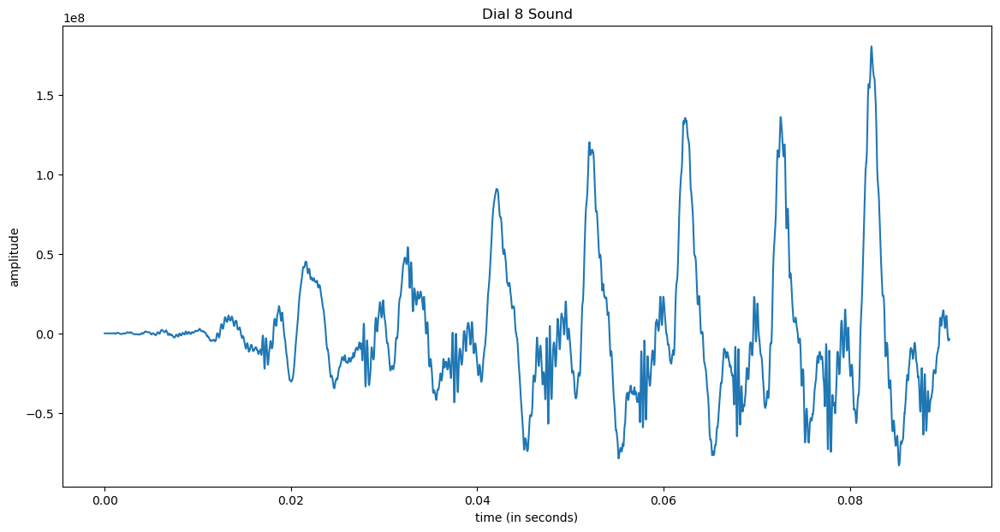

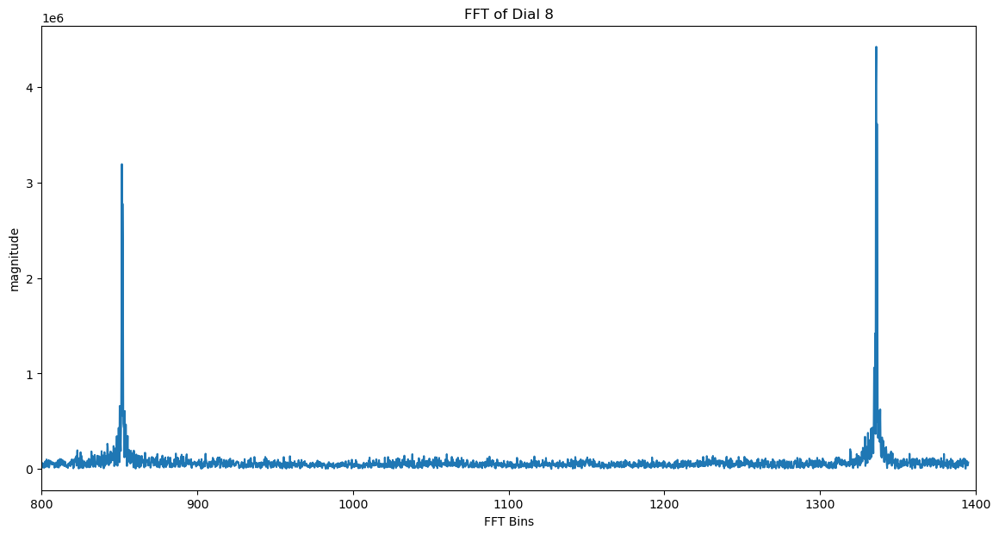

In [226]:
(sample_rate, input_signal) = scipy.io.wavfile.read("audio_files/Dial8.wav")
time_array = np.arange(0, len(input_signal)/sample_rate, 1/sample_rate)
setup_graph(title='Dial 8 Sound', x_label='time (in seconds)', y_label='amplitude', fig_size=(14,7))
_ = plt.plot(time_array[0:4000], input_signal[0:4000])

fft_out = np.fft.rfft(input_signal)
fft_mag = [np.sqrt(i.real**2 + i.imag**2)/len(fft_out) for i in fft_out]
num_samples = len(input_signal)
rfreqs = [(i*1.0/num_samples)*sample_rate for i in range(num_samples//2+1)]

setup_graph(title='FFT of Dial 8', x_label='FFT Bins', y_label='magnitude', fig_size=(14,7))
_ = plt.plot(rfreqs[0:6000], fft_mag[0:6000])
plt.xlim(800, 1400)

## Dial 9 = G#5 and G6 (but a bit sharper)

(800.0, 1550.0)

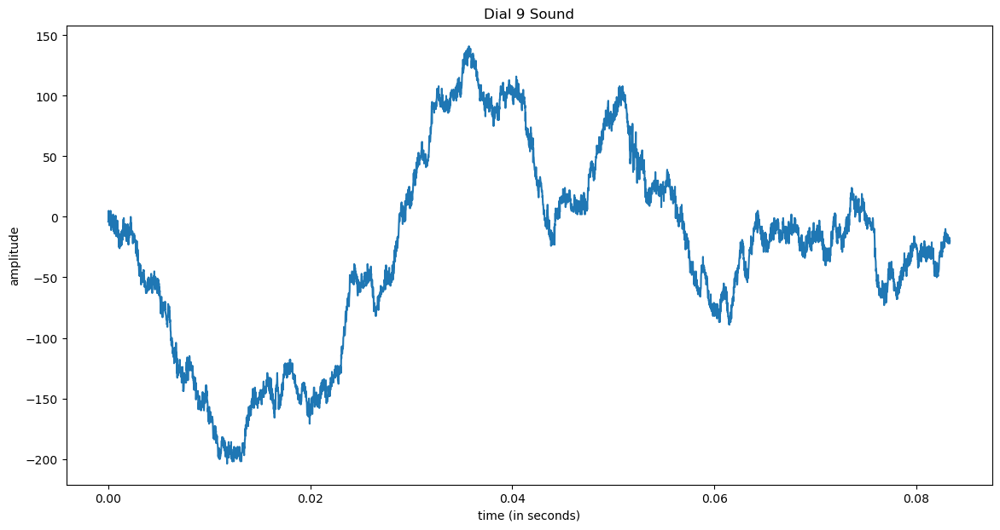

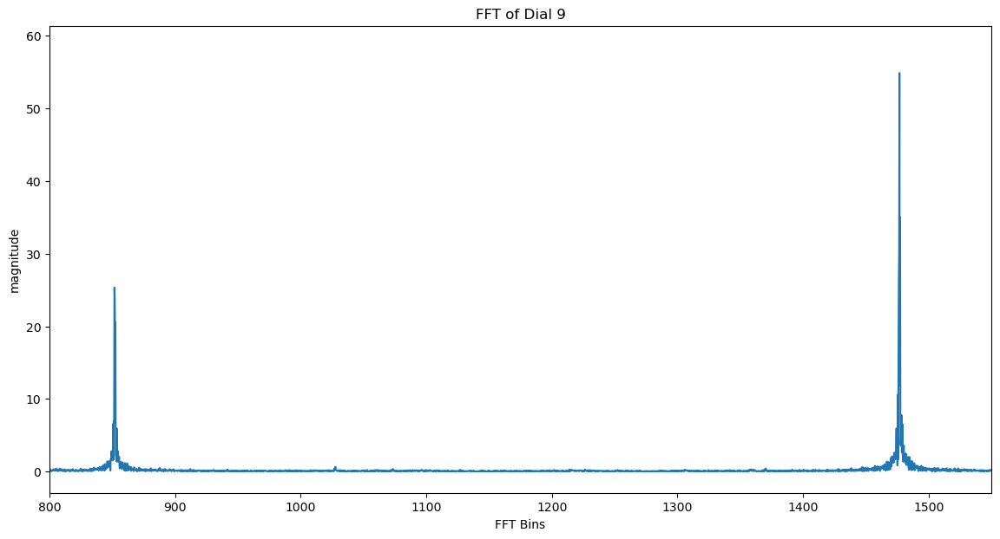

In [234]:
(sample_rate, input_signal) = scipy.io.wavfile.read("audio_files/Dial9.wav")
time_array = np.arange(0, len(input_signal)/sample_rate, 1/sample_rate)
setup_graph(title='Dial 9 Sound', x_label='time (in seconds)', y_label='amplitude', fig_size=(14,7))
_ = plt.plot(time_array[0:4000], input_signal[0:4000])

fft_out = np.fft.rfft(input_signal)
fft_mag = [np.sqrt(i.real**2 + i.imag**2)/len(fft_out) for i in fft_out]
num_samples = len(input_signal)
rfreqs = [(i*1.0/num_samples)*sample_rate for i in range(num_samples//2+1)]

setup_graph(title='FFT of Dial 9', x_label='FFT Bins', y_label='magnitude', fig_size=(14,7))
_ = plt.plot(rfreqs[0:6000], fft_mag[0:6000])
plt.xlim(800, 1550)

## Dial * = A#5 and D#6 (but a bit sharper)

(900.0, 1250.0)

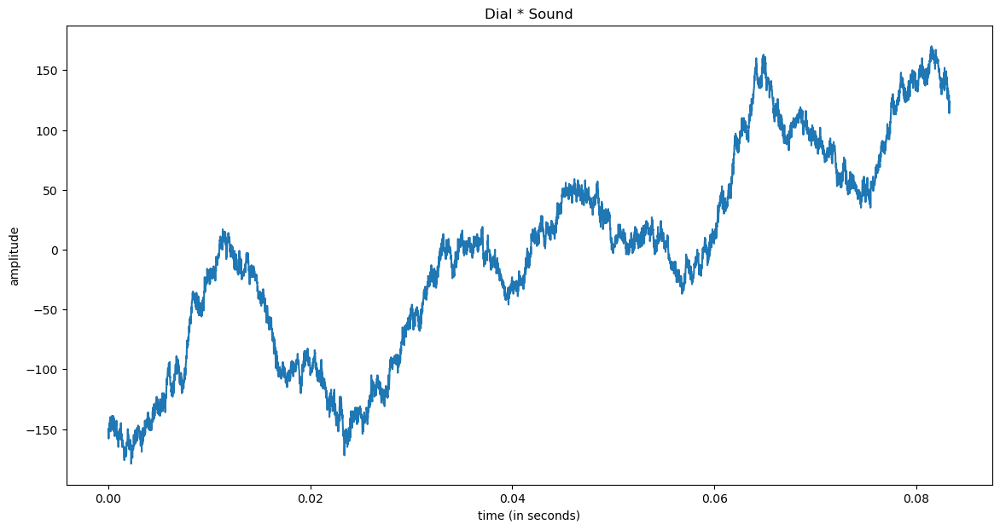

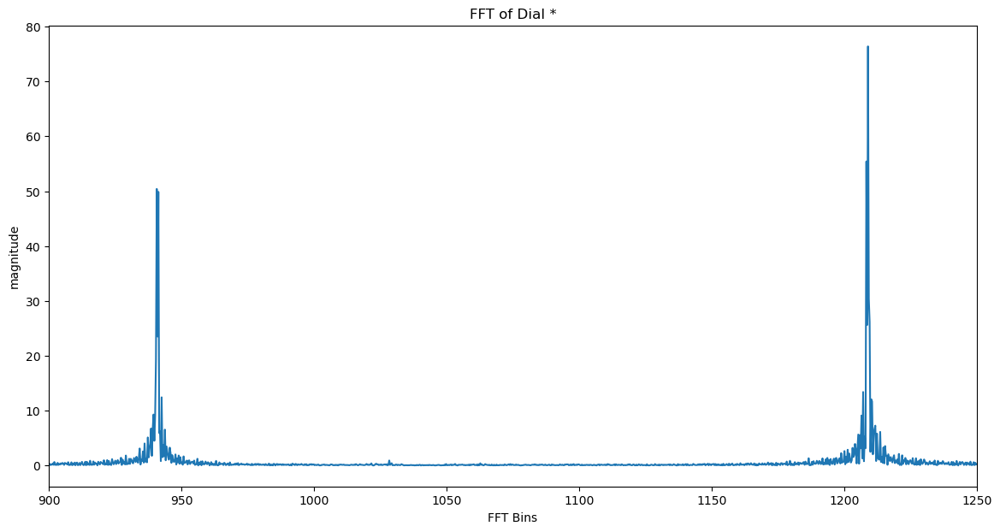

In [239]:
(sample_rate, input_signal) = scipy.io.wavfile.read("audio_files/DialStar.wav")
time_array = np.arange(0, len(input_signal)/sample_rate, 1/sample_rate)
setup_graph(title='Dial * Sound', x_label='time (in seconds)', y_label='amplitude', fig_size=(14,7))
_ = plt.plot(time_array[0:4000], input_signal[0:4000])

fft_out = np.fft.rfft(input_signal)
fft_mag = [np.sqrt(i.real**2 + i.imag**2)/len(fft_out) for i in fft_out]
num_samples = len(input_signal)
rfreqs = [(i*1.0/num_samples)*sample_rate for i in range(num_samples//2+1)]

setup_graph(title='FFT of Dial *', x_label='FFT Bins', y_label='magnitude', fig_size=(14,7))
_ = plt.plot(rfreqs[0:4500], fft_mag[0:4500])
plt.xlim(900, 1250)

## Dial 0 = A#5 and F6 (but a bit flatter)

(900.0, 1400.0)

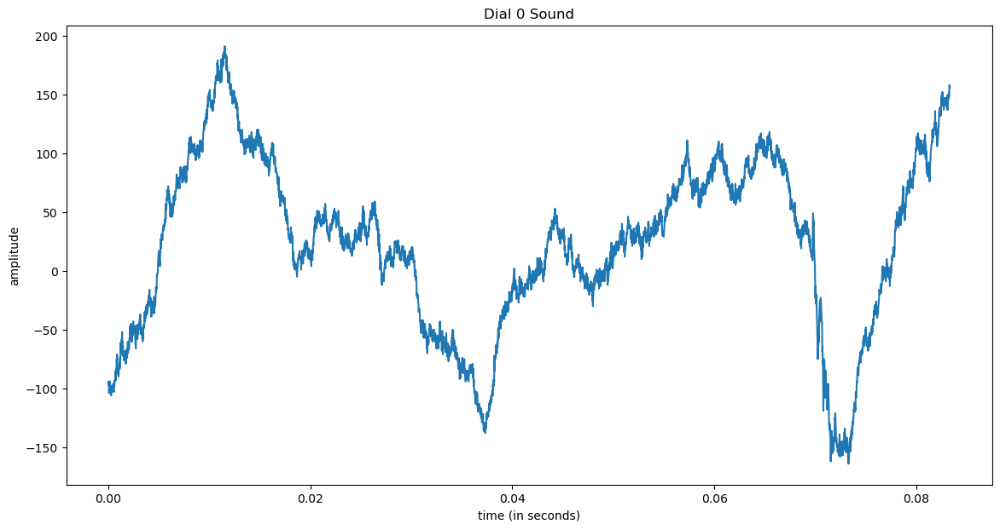

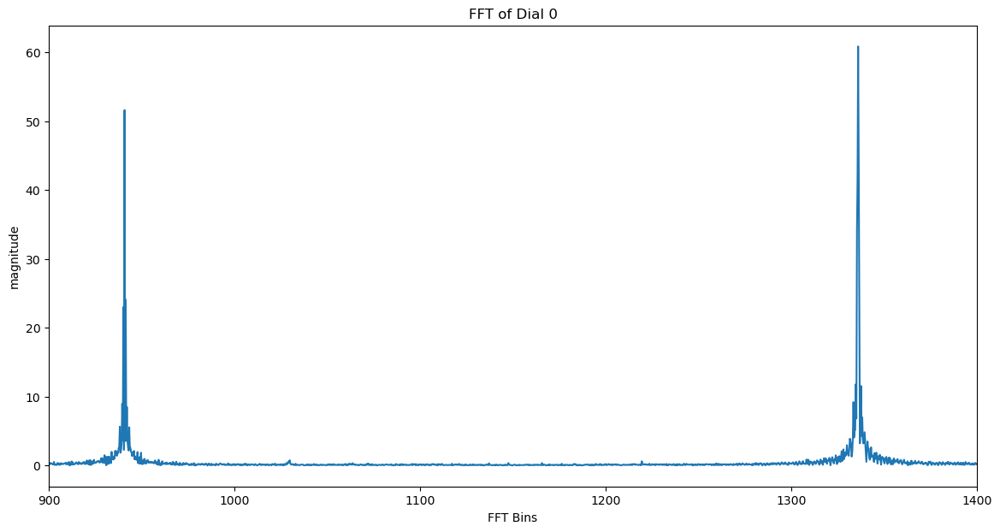

In [250]:
(sample_rate, input_signal) = scipy.io.wavfile.read("audio_files/Dial0.wav")
time_array = np.arange(0, len(input_signal)/sample_rate, 1/sample_rate)
setup_graph(title='Dial 0 Sound', x_label='time (in seconds)', y_label='amplitude', fig_size=(14,7))
_ = plt.plot(time_array[0:4000], input_signal[0:4000])

fft_out = np.fft.rfft(input_signal)
fft_mag = [np.sqrt(i.real**2 + i.imag**2)/len(fft_out) for i in fft_out]
num_samples = len(input_signal)
rfreqs = [(i*1.0/num_samples)*sample_rate for i in range(num_samples//2+1)]

setup_graph(title='FFT of Dial 0', x_label='FFT Bins', y_label='magnitude', fig_size=(14,7))
_ = plt.plot(rfreqs[0:4500], fft_mag[0:4500])
plt.xlim(900, 1400)

## Dial # = A#5 and F#6 (but a bit sharper)

(900.0, 1500.0)

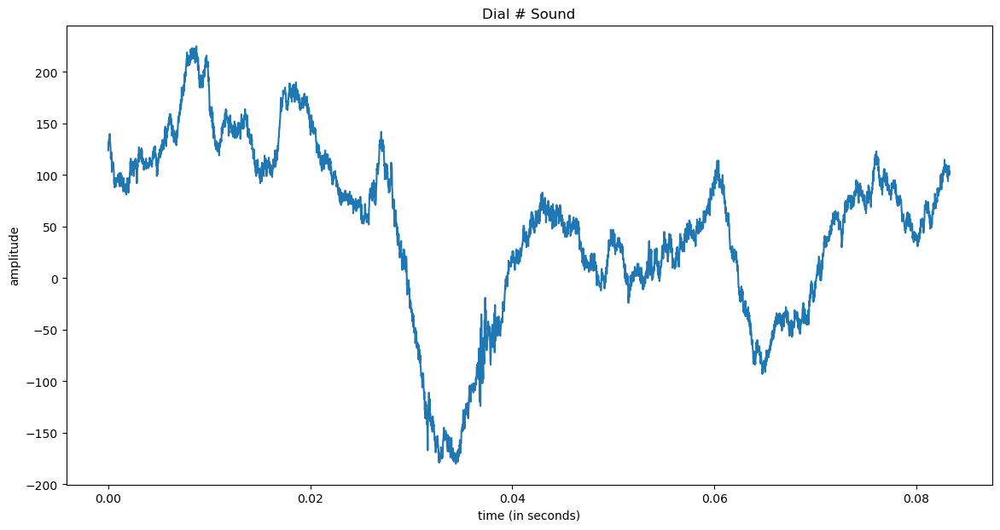

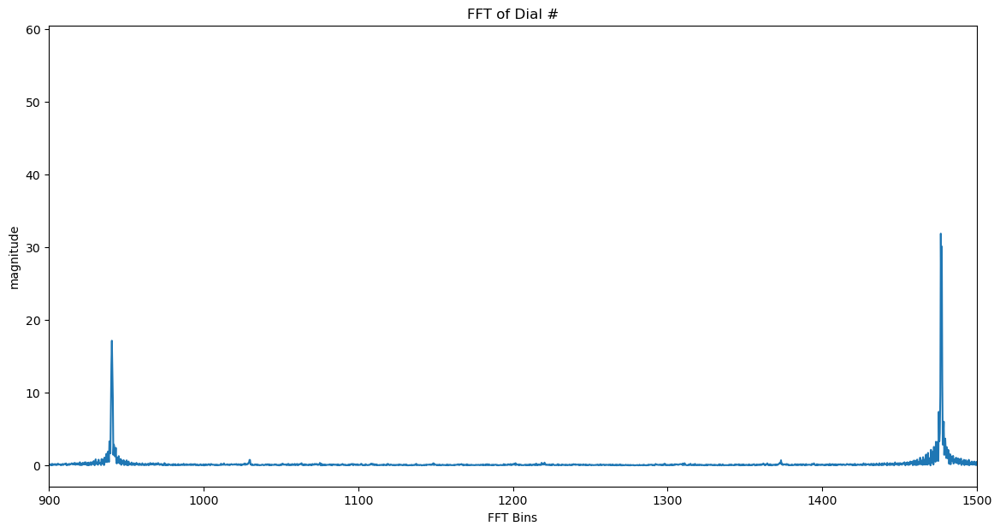

In [248]:
(sample_rate, input_signal) = scipy.io.wavfile.read("audio_files/DialPound.wav")
time_array = np.arange(0, len(input_signal)/sample_rate, 1/sample_rate)
setup_graph(title='Dial # Sound', x_label='time (in seconds)', y_label='amplitude', fig_size=(14,7))
_ = plt.plot(time_array[0:4000], input_signal[0:4000])

fft_out = np.fft.rfft(input_signal)
fft_mag = [np.sqrt(i.real**2 + i.imag**2)/len(fft_out) for i in fft_out]
num_samples = len(input_signal)
rfreqs = [(i*1.0/num_samples)*sample_rate for i in range(num_samples//2+1)]

setup_graph(title='FFT of Dial #', x_label='FFT Bins', y_label='magnitude', fig_size=(14,7))
_ = plt.plot(rfreqs[0:6000], fft_mag[0:6000])
plt.xlim(900, 1500)

As we go down each column, the lower frequencies go F5, G5, G#5, A#5. As a tetrachord, they sound minor.<br>As we go across rows, the higher frequencies go D#6 (bit sharper), F6 (bit flatter), F#6 (bit sharper).As a trichord, they also sound minor.<br>We find that only the higher notes are detuned which causes the dialtones to sound dissonant. Converting our signals to the frequency domain through FFT also shows that these higher notes are between two notes' known frequencies.

# FFT and Inverse FFT Application: Finding Notes and their Sinusoidal Waves from an Audio Sample (Strummed Guitar Chord)

In [22]:
!pip show scipy

Name: scipy
Version: 1.9.3
Summary: Fundamental algorithms for scientific computing in Python
Home-page: https://scipy.org/
Author: 
Author-email: 
License: Copyright (c) 2001-2002 Enthought, Inc. 2003-2022, SciPy Developers.
        All rights reserved.
        
        Redistribution and use in source and binary forms, with or without
        modification, are permitted provided that the following conditions
        are met:
        
        1. Redistributions of source code must retain the above copyright
           notice, this list of conditions and the following disclaimer.
        
        2. Redistributions in binary form must reproduce the above
           copyright notice, this list of conditions and the following
           disclaimer in the documentation and/or other materials provided
           with the distribution.
        
        3. Neither the name of the copyright holder nor the names of its
           contributors may be used to endorse or promote products derived


48000


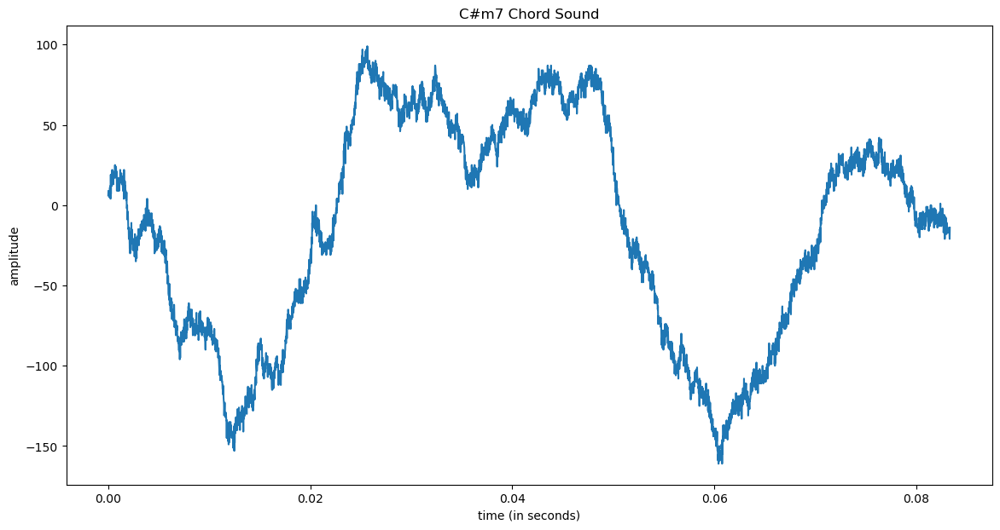

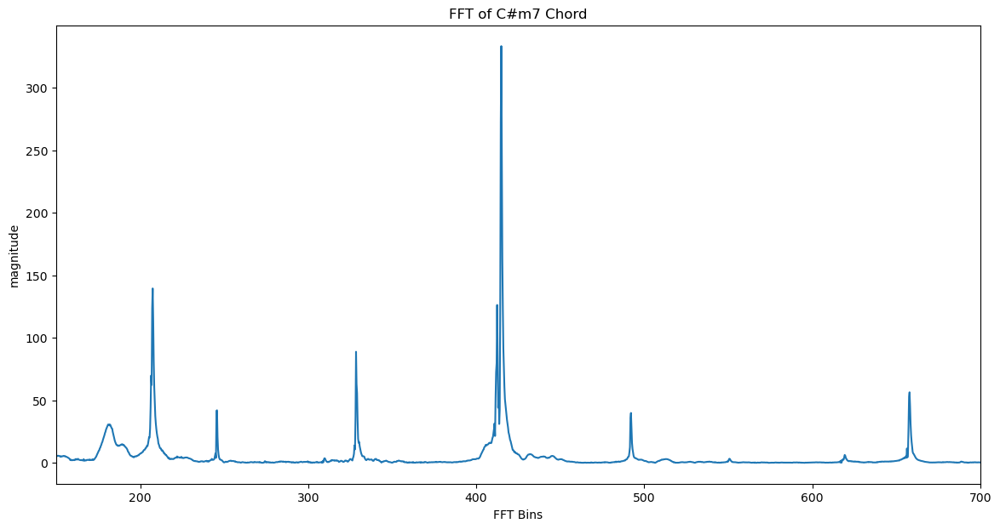

In [26]:
from scipy.signal import butter, lfilter
from scipy.fftpack import ifft


(sample_rate, input_signal) = scipy.io.wavfile.read("audio_files/C#m7 Chord.wav")
time_array = np.arange(0, len(input_signal)/sample_rate, 1/sample_rate)
setup_graph(title='C#m7 Chord Sound', x_label='time (in seconds)', y_label='amplitude', fig_size=(14,7))
_ = plt.plot(time_array[0:4000], input_signal[0:4000])

# Apply Foward FFT to the signal
fft_data = np.fft.fft(input_signal)
fft_out = np.fft.rfft(input_signal)
fft_mag = [np.sqrt(i.real**2 + i.imag**2)/len(fft_out) for i in fft_out]
num_samples = len(input_signal)
rfreqs = [(i*1.0/num_samples)*sample_rate for i in range(num_samples//2+1)]

setup_graph(title='FFT of C#m7 Chord', x_label='FFT Bins', y_label='magnitude', fig_size=(14,7))
_ = plt.plot(rfreqs[0:5000], fft_mag[0:5000])
plt.xlim(150, 700)
print(sample_rate)

# Play the audio signal
from IPython.display import Audio
Audio(input_signal, rate=sample_rate)

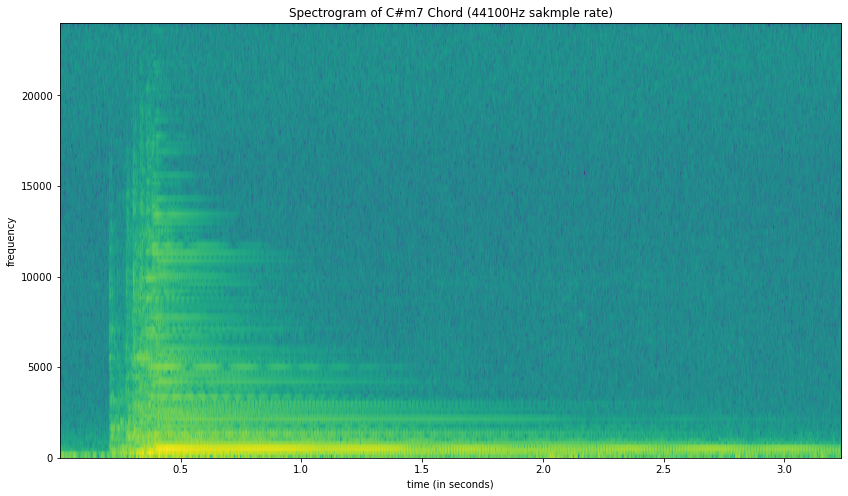

In [24]:
setup_graph(title='Spectrogram of C#m7 Chord (44100Hz sakmple rate)', x_label='time (in seconds)', y_label='frequency', fig_size=(14,8))
_ = plt.specgram(input_signal, Fs=sample_rate)

## Sinusoidal Waves of C#, E, G#, B

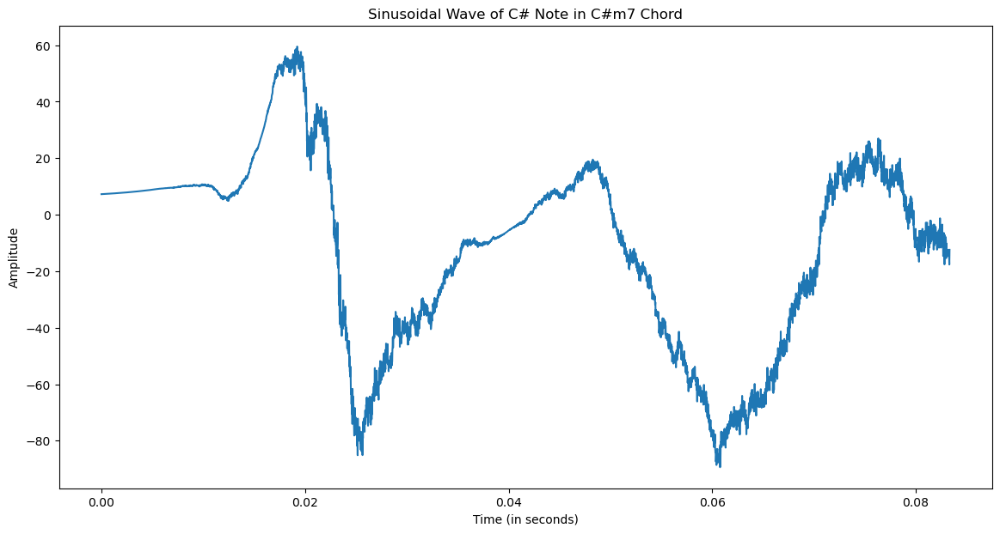

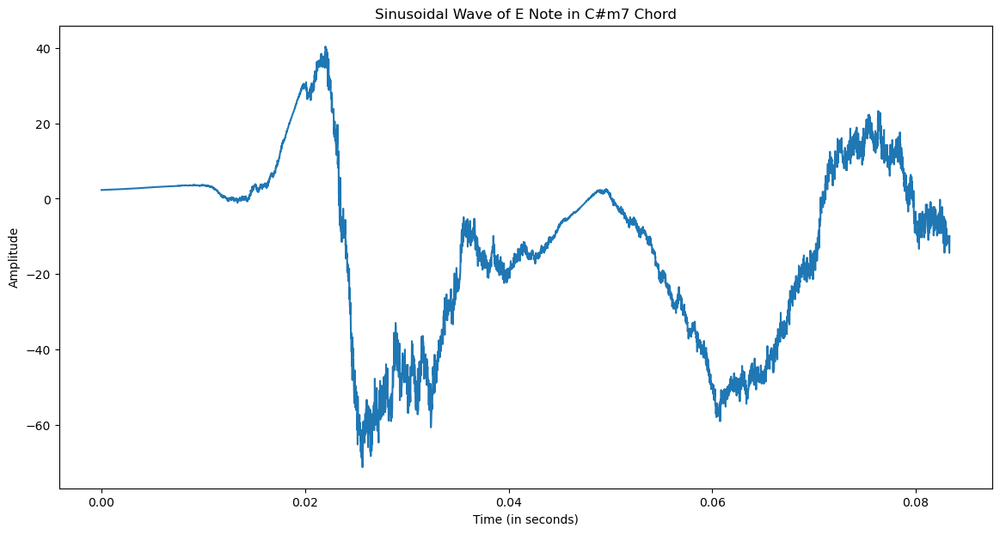

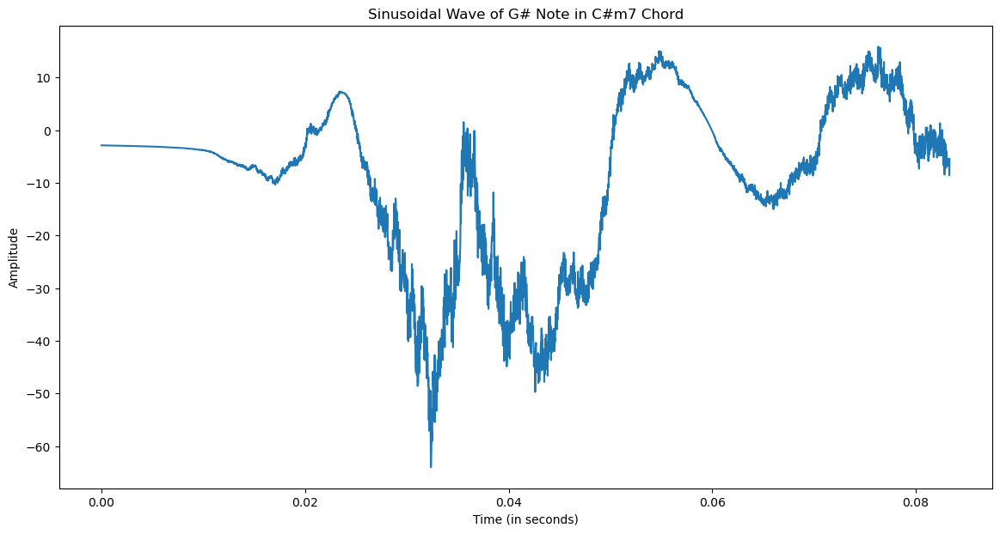

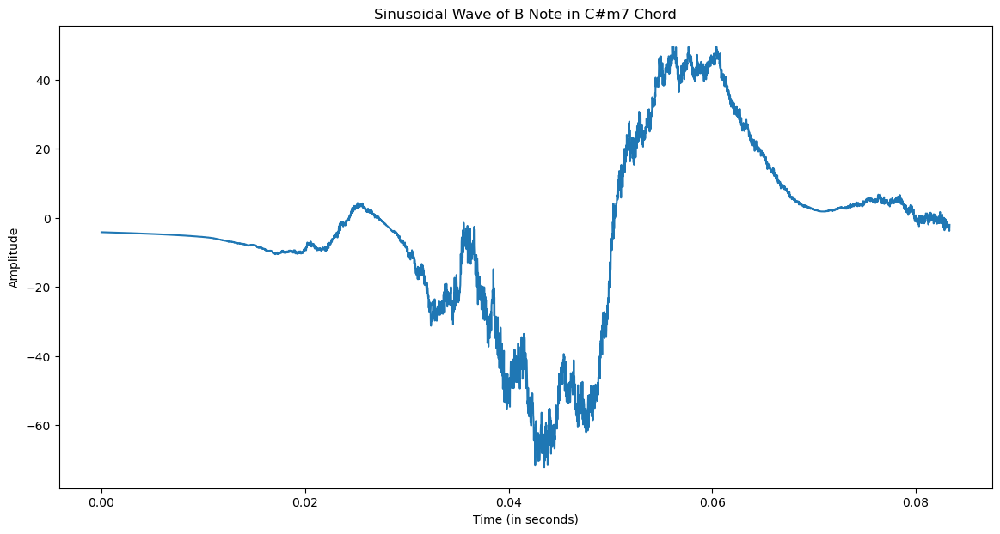

In [74]:
from IPython.display import Audio

# Frequency range of C# note
f_low = 277.183
f_high = 300.00
# Convert cutoff frequency to the corresponding normalized frequency
lowpass_cutoff_normalized = f_high / (sample_rate / 2)
highpass_cutoff_normalized = f_low / (sample_rate / 2)
# Create a 5th order Butterworth low-pass filter with a cutoff at the upper end of the targeted frequency range
b, a = butter(5, lowpass_cutoff_normalized, 'low')
# Apply low-pass filter to FFT
fft_data_filtered = lfilter(b, a, fft_data)
# # Create a 5th order Butterworth high-pass filter with a cutoff at the upper end of the targeted frequency range
b, a = butter(5, highpass_cutoff_normalized, 'high')
# Apply high-pass filter to FFT
fft_data_filtered = lfilter(b, a, fft_data)
# Remove singleton dimensions from the filtered FFT
fft_data_squeezed = np.squeeze(fft_data_filtered)

# Apply Inverse FFT on the filtered FFT
wave_data_complex = np.fft.ifft(fft_data_squeezed)
# Extract real part from Inverse FFT
wave_data_real = np.real(wave_data_complex)
# Duration of audio signal (seconds)
signal_duration = len(wave_data_real) / sample_rate
# Create an array of time values, with one value for each sample in the signal
wave_time = np.arange(0, signal_duration, 1/sample_rate)

# Graph our Inverse FFT of the C# Note
setup_graph(title='Sinusoidal Wave of C# Note in C#m7 Chord', x_label='Time (in seconds)', y_label='Amplitude', fig_size=(14,7))
_ = plt.plot(wave_time[0:4000], wave_data_real[0:4000])

# Find the minimum and maximum values in the array
min_value = np.min(wave_data_real)
max_value = np.max(wave_data_real)

# Calculate the range of the array
array_range = max_value - min_value

# Normalize the array by subtracting the minimum value and dividing by the range
wave_data_normalized = (wave_data_real - min_value) / array_range

# Multiply by 2 and subtract 1 to scale the array to the range [-1, 1]
wave_data_normalized = 2 * wave_data_normalized - 1

# Open a new WAV file for writing using the wave.open() function
with wave.open('audio_files/C# Sine Wave.wav', 'wb') as wav_file:
    # Set the sample width and number of channels in the WAV file
    wav_file.setsampwidth(2)
    wav_file.setnchannels(1)

    # Set the sample rate and number of frames in the WAV file
    wav_file.setframerate(sample_rate)
    wav_file.setnframes(len(wave_data_normalized))

    # Write the audio data to the WAV file using the wave.writeframes() function
    wav_file.writeframes(wave_data_normalized)
    

# Frequency range of E note
f_low = 329.628
f_high = 350.00
# Convert cutoff frequency to the corresponding normalized frequency
lowpass_cutoff_normalized = f_high / (sample_rate / 2)
highpass_cutoff_normalized = f_low / (sample_rate / 2)
# Create a 5th order Butterworth low-pass filter with a cutoff at the upper end of the targeted frequency range
b, a = butter(5, lowpass_cutoff_normalized, 'low')
# Apply low-pass filter to FFT
fft_data_filtered = lfilter(b, a, fft_data)
# # Create a 5th order Butterworth high-pass filter with a cutoff at the upper end of the targeted frequency range
b, a = butter(5, highpass_cutoff_normalized, 'high')
# Apply high-pass filter to FFT
fft_data_filtered = lfilter(b, a, fft_data)
# Remove singleton dimensions from the filtered FFT
fft_data_squeezed = np.squeeze(fft_data_filtered)

# Apply Inverse FFT on the filtered FFT
wave_data_complex = np.fft.ifft(fft_data_squeezed)
# Extract real part from Inverse FFT
wave_data_real = np.real(wave_data_complex)
# Duration of audio signal (seconds)
signal_duration = len(wave_data_real) / sample_rate
# Create an array of time values, with one value for each sample in the signal
wave_time = np.arange(0, signal_duration, 1/sample_rate)

# Graph our Inverse FFT of the E Note
setup_graph(title='Sinusoidal Wave of E Note in C#m7 Chord', x_label='Time (in seconds)', y_label='Amplitude', fig_size=(14,7))
_ = plt.plot(wave_time[0:4000], wave_data_real[0:4000])

# Find the minimum and maximum values in the array
min_value = np.min(wave_data_real)
max_value = np.max(wave_data_real)

# Calculate the range of the array
array_range = max_value - min_value

# Normalize the array by subtracting the minimum value and dividing by the range
wave_data_normalized = (wave_data_real - min_value) / array_range

# Multiply by 2 and subtract 1 to scale the array to the range [-1, 1]
wave_data_normalized = 2 * wave_data_normalized - 1

# Open a new WAV file for writing using the wave.open() function
with wave.open('audio_files/E Sine Wave.wav', 'wb') as wav_file:
    # Set the sample width and number of channels in the WAV file
    wav_file.setsampwidth(2)
    wav_file.setnchannels(1)

    # Set the sample rate and number of frames in the WAV file
    wav_file.setframerate(sample_rate)
    wav_file.setnframes(len(wave_data_normalized))

    # Write the audio data to the WAV file using the wave.writeframes() function
    wav_file.writeframes(wave_data_normalized)

    
# Frequency range of G# note
f_low = 415.305
f_high = 450.00
# Convert cutoff frequency to the corresponding normalized frequency
lowpass_cutoff_normalized = f_high / (sample_rate / 2)
highpass_cutoff_normalized = f_low / (sample_rate / 2)
# Create a 5th order Butterworth low-pass filter with a cutoff at the upper end of the targeted frequency range
b, a = butter(5, lowpass_cutoff_normalized, 'low')
# Apply low-pass filter to FFT
fft_data_filtered = lfilter(b, a, fft_data)
# # Create a 5th order Butterworth high-pass filter with a cutoff at the upper end of the targeted frequency range
b, a = butter(5, highpass_cutoff_normalized, 'high')
# Apply high-pass filter to FFT
fft_data_filtered = lfilter(b, a, fft_data)
# Remove singleton dimensions from the filtered FFT
fft_data_squeezed = np.squeeze(fft_data_filtered)

# Apply Inverse FFT on the filtered FFT
wave_data_complex = np.fft.ifft(fft_data_squeezed)
# Extract real part from Inverse FFT
wave_data_real = np.real(wave_data_complex)
# Duration of audio signal (seconds)
signal_duration = len(wave_data_real) / sample_rate
# Create an array of time values, with one value for each sample in the signal
wave_time = np.arange(0, signal_duration, 1/sample_rate)

# Graph our Inverse FFT of the G# Note
setup_graph(title='Sinusoidal Wave of G# Note in C#m7 Chord', x_label='Time (in seconds)', y_label='Amplitude', fig_size=(14,7))
_ = plt.plot(wave_time[0:4000], wave_data_real[0:4000])

# Find the minimum and maximum values in the array
min_value = np.min(wave_data_real)
max_value = np.max(wave_data_real)

# Calculate the range of the array
array_range = max_value - min_value

# Normalize the array by subtracting the minimum value and dividing by the range
wave_data_normalized = (wave_data_real - min_value) / array_range

# Multiply by 2 and subtract 1 to scale the array to the range [-1, 1]
wave_data_normalized = 2 * wave_data_normalized - 1

# Open a new WAV file for writing using the wave.open() function
with wave.open('audio_files/G# Sine Wave.wav', 'wb') as wav_file:
    # Set the sample width and number of channels in the WAV file
    wav_file.setsampwidth(2)
    wav_file.setnchannels(1)

    # Set the sample rate and number of frames in the WAV file
    wav_file.setframerate(sample_rate)
    wav_file.setnframes(len(wave_data_normalized))

    # Write the audio data to the WAV file using the wave.writeframes() function
    wav_file.writeframes(wave_data_normalized)
    
    
# Frequency range of B note
f_low = 493.883
f_high = 510.00
# Convert cutoff frequency to the corresponding normalized frequency
lowpass_cutoff_normalized = f_high / (sample_rate / 2)
highpass_cutoff_normalized = f_low / (sample_rate / 2)
# Create a 5th order Butterworth low-pass filter with a cutoff at the upper end of the targeted frequency range
b, a = butter(5, lowpass_cutoff_normalized, 'low')
# Apply low-pass filter to FFT
fft_data_filtered = lfilter(b, a, fft_data)
# # Create a 5th order Butterworth high-pass filter with a cutoff at the upper end of the targeted frequency range
b, a = butter(5, highpass_cutoff_normalized, 'high')
# Apply high-pass filter to FFT
fft_data_filtered = lfilter(b, a, fft_data)
# Remove singleton dimensions from the filtered FFT
fft_data_squeezed = np.squeeze(fft_data_filtered)

# Apply Inverse FFT on the filtered FFT (which includes complex and real parts)
wave_data_complex = np.fft.ifft(fft_data_squeezed)
# Extract real part from Inverse FFT
wave_data_real = np.real(wave_data_complex)
# Duration of audio signal (seconds)
signal_duration = len(wave_data_real) / sample_rate
# Create an array of time values, with one value for each sample in the signal
wave_time = np.arange(0, signal_duration, 1/sample_rate)

# Graph our Inverse FFT of the B Note
setup_graph(title='Sinusoidal Wave of B Note in C#m7 Chord', x_label='Time (in seconds)', y_label='Amplitude', fig_size=(14,7))
_ = plt.plot(wave_time[0:4000], wave_data_real[0:4000])

# Find the minimum and maximum values in the array
min_value = np.min(wave_data_real)
max_value = np.max(wave_data_real)

# Calculate the range of the array
array_range = max_value - min_value

# Normalize the array by subtracting the minimum value and dividing by the range
wave_data_normalized = (wave_data_real - min_value) / array_range

# Multiply by 2 and subtract 1 to scale the array to the range [-1, 1]
wave_data_normalized = 2 * wave_data_normalized - 1

# Open a new WAV file for writing using the wave.open() function
with wave.open('audio_files/B Sine Wave.wav', 'wb') as wav_file:
    # Set the sample width and number of channels in the WAV file
    wav_file.setsampwidth(2)
    wav_file.setnchannels(1)

    # Set the sample rate and number of frames in the WAV file
    wav_file.setframerate(sample_rate)
    wav_file.setnframes(len(wave_data_normalized))

    # Write the audio data to the WAV file using the wave.writeframes() function
    wav_file.writeframes(wave_data_normalized)

Here are the WAV files for the signals we created above from inverse FFT (in order):

In [68]:
(sample_rate, input_signal) = scipy.io.wavfile.read("audio_files/C# Sine Wave.wav")
Audio(input_signal, rate=sample_rate)

In [69]:
(sample_rate, input_signal) = scipy.io.wavfile.read("audio_files/E Sine Wave.wav")
Audio(input_signal, rate=sample_rate)

In [70]:
(sample_rate, input_signal) = scipy.io.wavfile.read("audio_files/G# Sine Wave.wav")
Audio(input_signal, rate=sample_rate)

In [71]:
(sample_rate, input_signal) = scipy.io.wavfile.read("audio_files/B Sine Wave.wav")
Audio(input_signal, rate=sample_rate)

The C#m7 chord I strummed is composed of notes G#, C#, G#, B, E, G#. The C#m7 chord consists of C#, E, G#, B. <br>
However, FFT shows peaks at frequencies for G#, B, E, G#, B, E. <br>Why is the C# not represented in the Forward FFT, but the Inverse FFT can still produce a sine wave of the C# note from the FFT? It may be due to the way I played the chord, resulting in different volume, attack, and decay.<br>I've found out that the reason why some note frequencies such as C# may not be represented is because the highest peak in the FFT signal representing G# may be overdominating the other notes as I played the chord, so the other frequencies may only represent the harmonic frequencies of the dominant frequency, G#, rather than the other notes I played. Or possibly the lower peaks representing B and E may actually be harmonics of the upper peaks representing B and E. Not only do the FFT and inverse FFT have limitations, but this also may be why our produced audio files of the sinusoidal waves are very high pitched sounds with lots of noise in the background (although we can listen carefully to the WAV files and find that the high-pitched sounds are increasing in frequency from C# to B).<br>Regardless, it is difficult to tell as this strum signal is too complex. Following Prof. Badiey's suggestion, we should start with a simpler signal such as a synthesized sine wave or one guitar string played rather than a strum containing 6 strings played in close succession.

# Applying FFT and Inverse FFT to a synthesized sine wave sound